## Matrix Processing with Pandas
### 2023-10-12

This notebook details the step to process the matrix of allele frequencies for each variant in each sample. The matrix is generated from the output `bcftools` pipeline.

### Loading data into Pandas

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# set the display format for floating-point numbers
pd.options.display.float_format = '{:.4f}'.format
pd.set_option('display.max_columns', 999)

In [3]:
# load an example filtered matrix of footprinting scores, which overlap the variant sites in the vcf files

df_fpscore = pd.read_csv("/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/fps/TFDP1_M08108_2.00_BRCA-subtype-vcf-filtered-matrix.txt", sep="\t")

# drop the column "TFBS_strand" and "TFBS_score"
df_fpscore = df_fpscore.drop(columns=["TFBS_strand", "TFBS_score"])
# rename columns in the dataframe
df_fpscore = df_fpscore.rename(columns={"TFBS_chr": "Chromosome", "TFBS_start": "Start", "TFBS_end": "End", "2GAMBDQ_Normal-like_score": "2GAMBDQ_Norm_fps"})
# for all column names that end with the string 'score', replace the string with 'fps'
df_fpscore = df_fpscore.rename(columns=lambda x: x.replace('score', 'fps') if x.endswith('score') else x)
df_fpscore.head(n=10)

,Chromosome,Start,End,98JKPD8_LumA_fps,ANAB5F7_Basal_fps,S6R691V_Her2_fps,PU24GB8_LumB_fps,2GAMBDQ_Norm_fps
0,chr1,191257,191268,0.0000,0.0000,0.0000,0.0000,0.0000
1,chr1,818021,818032,0.0297,0.0440,0.0213,0.0347,0.0344
2,chr1,818780,818791,0.0257,0.0238,0.0227,0.0281,0.0339
3,chr1,960570,960581,0.2805,0.3350,0.2849,0.2762,0.2299
4,chr1,977015,977026,1.1005,0.5051,0.7104,1.2130,1.3015
5,chr1,977047,977058,0.8818,0.4097,0.5317,0.9863,1.0710
6,chr1,977110,977121,0.1314,0.0885,0.1054,0.1681,0.1549
7,chr1,977142,977153,0.1444,0.0823,0.0923,0.1781,0.1429
8,chr1,977174,977185,0.2262,0.1063,0.1381,0.2432,0.2231
9,chr1,977206,977217,0.2971,0.1549,0.2170,0.3343,0.3109


In [4]:
# create a vcf load function for the query vcfs
def load_vcf(vcf_path):
    # load up the vcf file with indels and multiallelic sites split into separate rows
    df_vcf = pd.read_csv(vcf_path, sep="\t")
    # rename columns in the dataframe
    df_vcf = df_vcf.rename(columns={"#[1]CHROM": "Chromosome", "[2]POS": "Start", "[3]REF": "ref_allele", "[4]ALT": "alt_allele", "[5]AF": "AF"})
    # add a column next to the "start" column called "end" with the same value as the "start" column
    df_vcf.insert(2, "End", df_vcf["Start"])
    return df_vcf

# now put the paths in a list
paths = [
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/ANAB5F7/ANAB5F7_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/98JKPD8/98JKPD8_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/PU24GB8/PU24GB8_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/S6R691V/S6R691V_TFDP1_M08108_2.00_AF-per-site-with-indels.txt",
    "/home/msazizan/hyperspace/gatk-workflow/plotting/raw_inputs/af/2GAMBDQ/2GAMBDQ_TFDP1_M08108_2.00_AF-per-site-with-indels.txt"
]

# create a list of IDs
ids = [ "ANAB5F7_basal", "98JKPD8_lumA", "PU24GB8_lumB", "S6R691V_her2", "2GAMBDQ_norm"]

# create a pair dictionary
path_id_dict = {id: load_vcf(path) for id in ids for path in paths if id.split("_")[0] in path}

print(path_id_dict)


{'ANAB5F7_basal':      Chromosome      Start        End ref_allele   alt_allele     AF
0          chr1     818025     818025          C            A 0.8125
1          chr1     818783     818783          T            C 0.0333
2          chr1     977023     977023          G            A 0.9412
3          chr1     977055     977055          G            A 0.5000
4          chr1     977118     977118          G            A 0.8529
...         ...        ...        ...        ...          ...    ...
5979       chrX  153494830  153494830          G            A 0.3529
5980       chrX  153495413  153495413          G            A 0.8824
5981       chrX  154444635  154444635    GGGACGG  GGGACGGACGG 0.0588
5982       chrY   11108021   11108021          C            T 0.3824
5983       chrY   11108024   11108024          C            T 0.2941

[5984 rows x 6 columns], '98JKPD8_lumA':      Chromosome      Start        End ref_allele   alt_allele     AF
0          chr1     818025     818025      

### Converting Dataframes into Pyranges Objects with PyRanges

In [5]:
import pyranges as pr

gr_fpscore = pr.PyRanges(df_fpscore)
print(type(gr_fpscore))
gr_fpscore

<class 'pyranges.pyranges_main.PyRanges'>


/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,Chromosome,Start,End,98JKPD8_LumA_fps,ANAB5F7_Basal_fps,S6R691V_Her2_fps,PU24GB8_LumB_fps,2GAMBDQ_Norm_fps
0,chr1,191257,191268,0.0000,0.0000,0.0000,0.0000,0.0000
1,chr1,818021,818032,0.0297,0.0440,0.0213,0.0347,0.0344
2,chr1,818780,818791,0.0257,0.0238,0.0227,0.0281,0.0339
3,chr1,960570,960581,0.2805,0.3350,0.2849,0.2762,0.2299
4,chr1,977015,977026,1.1005,0.5051,0.7104,1.2130,1.3015
...,...,...,...,...,...,...,...,...
9555,chrX,153934861,153934872,0.1967,0.1679,0.1721,0.1905,0.1616
9556,chrX,154444629,154444640,0.0490,0.0743,0.0731,0.0901,0.0423
9557,chrX,155010397,155010408,0.0118,0.0050,0.0088,0.0130,0.0199
9558,chrX,155641610,155641621,0.0125,0.0124,0.0133,0.0149,0.0174


In [17]:
# delete a variable from current namespace
# %reset_selective -f pathstring

In [6]:
# load up vcf dfs into pyranges 
grs = {}
for name,vcf in path_id_dict.items():
    gr_vcf = pr.PyRanges(vcf)
    grs[name] = gr_vcf

print(grs)

{'ANAB5F7_basal': +--------------+-----------+-----------+--------------+-------+
| Chromosome   | Start     | End       | ref_allele   | +2    |
| (category)   | (int64)   | (int64)   | (object)     | ...   |
|--------------+-----------+-----------+--------------+-------|
| chr1         | 818025    | 818025    | C            | ...   |
| chr1         | 818783    | 818783    | T            | ...   |
| chr1         | 977023    | 977023    | G            | ...   |
| chr1         | 977055    | 977055    | G            | ...   |
| ...          | ...       | ...       | ...          | ...   |
| chrX         | 154444635 | 154444635 | GGGACGG      | ...   |
| chrX         | 153495413 | 153495413 | G            | ...   |
| chrX         | 153494830 | 153494830 | G            | ...   |
| chrX         | 150364545 | 150364545 | C            | ...   |
| chrY         | 11108024  | 11108024  | C            | ...   |
| chrY         | 11108021  | 11108021  | C            | ...   |
+--------------+------

/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain c

### Exploratory Plots with Seaborn

In [ ]:
count = 0
for key, val in grs.items():
    
    if count == 0:
        overlap = gr_fpscore.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    else:
        overlap = overlap.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    
    # drop the column "End" column
    overlap = overlap.drop([f"End_{key}_varsite_pos"])

    # cast back into a dataframe and rename metadata columns
    df = overlap.df.rename(columns={f"Start_{key}_varsite_pos": f"{key}_varsite_pos", "ref_allele": f"{key}_ref_allele", "alt_allele": f"{key}_alt_allele", "AF": f"{key}_AF"})
    
    # replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
    # Define a dictionary mapping column names to values to replace
    replace_dict = {f"{key}_varsite_pos": {-1: None}, f"{key}_ref_allele": {str(-1): None}, f"{key}_alt_allele": {str(-1): None}, f"{key}_AF": {-1: 0}}
    df = df.replace(replace_dict)

    # cast back into pyrange object
    overlap = pr.PyRanges(df)

    # increment count
    count += 1

# save to file
# overlap.df.to_csv("TFDP1_M08108_2.00_fpscore-af-varsites-combined-matrix.tsv", sep="\t", index=False, na_rep='NULL')

overlap.df[19:30]

The chr regions are somehow not unique anymore because each region can be associated with multiple alleles and these are written onto new lines. To reduce the chr regions to unique sites and collapse the rows into unique regions, what we can do is to assign only the allelic site that has the largest AF value out of the rest mapped to the same region (using `max()` method).

First, write a test script to see if the logic works. 

In [ ]:
test_overlap = gr_fpscore.join(grs['ANAB5F7_basal'], how='left', suffix="_ANAB5F7_basal_varsite_pos", preserve_order = True)

# drop END column
test_overlap = test_overlap.drop(["End_ANAB5F7_basal_varsite_pos"])
# cluster the pyRanges object by genomic range
test_overlap = test_overlap.cluster(slack=-1)
# filter the pandas df representation of the pyRanges object by the AF column max value for each cluster/group
filtered_df = test_overlap.df.loc[test_overlap.df.groupby('Cluster')['AF'].idxmax()]
# then rename the columns 
filtered_df = filtered_df.rename(columns={"Start_ANAB5F7_basal_varsite_pos": "ANAB5F7_basal_varsite_pos", "ref_allele": "ANAB5F7_basal_ref_allele", "alt_allele": "ANAB5F7_basal_alt_allele", "AF": "ANAB5F7_basal_AF"})
# replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
# Define a dictionary mapping column names to values to replace
replace_dict = {"ANAB5F7_basal_varsite_pos": {-1: None}, "ANAB5F7_basal_ref_allele": {str(-1): None}, "ANAB5F7_basal_alt_allele": {str(-1): None}, "ANAB5F7_basal_AF": {-1: 0}}
filtered_df = filtered_df.replace(replace_dict)
# drop cluster column
filtered_df = filtered_df.drop(columns=["Cluster"])

filtered_gr = pr.PyRanges(filtered_df)

test_overlap = filtered_gr.join(grs['2GAMBDQ_norm'], how='left', suffix="_2GAMBDQ_norm_varsite_pos", preserve_order = True)
# drop END column
test_overlap = test_overlap.drop(["End_2GAMBDQ_norm_varsite_pos"])
# cluster the pyRanges object by genomic range
test_overlap = test_overlap.cluster(slack=-1)
# filter the pandas df representation of the pyRanges object by the AF column max value for each cluster/group
filtered_df = test_overlap.df.loc[test_overlap.df.groupby('Cluster')['AF'].idxmax()]
# then rename the columns 
filtered_df = filtered_df.rename(columns={"Start_2GAMBDQ_norm_varsite_pos": "2GAMBDQ_norm_varsite_pos", "ref_allele": "2GAMBDQ_norm_ref_allele", "alt_allele": "2GAMBDQ_norm_alt_allele", "AF": "2GAMBDQ_norm_AF"})
# replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
# Define a dictionary mapping column names to values to replace
replace_dict = {"2GAMBDQ_norm_varsite_pos": {-1: None}, "2GAMBDQ_norm_ref_allele": {str(-1): None}, "2GAMBDQ_norm_alt_allele": {str(-1): None}, "2GAMBDQ_norm_AF": {-1: 0}}
filtered_df = filtered_df.replace(replace_dict)
# drop cluster column
filtered_df = filtered_df.drop(columns=["Cluster"])
filtered_df.iloc[19:30]
# filtered_df.shape

# # merge back the af_max series with the original dataframe
# result_df = test_overlap.df.merge(af_max, left_on='Cluster', right_index=True, suffixes=('', '_max'))
# result_df.head(n=30)

Then, incorporate a `for` loop to process and merge all of the subtype data. 

In [7]:
count = 0
for key, val in grs.items():  
    if count == 0:
        overlap = gr_fpscore.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    else:
        overlap = filtered_gr.join(val, how='left', suffix=f"_{key}_varsite_pos", preserve_order = True)
    
    # drop the column "End" column
    overlap = overlap.drop([f"End_{key}_varsite_pos"])

    # cluster the pyRanges object by genomic range
    overlap = overlap.cluster(slack=-1)

    # cast back into a dataframe and filter by the AF column's max value (per cluster); this returns a filtered dataframe
    filtered_df = overlap.df.loc[overlap.df.groupby('Cluster')['AF'].idxmax()]

    # then rename the columns
    filtered_df = filtered_df.rename(columns={f"Start_{key}_varsite_pos": f"{key}_varsite_pos", "ref_allele": f"{key}_ref_allele", "alt_allele": f"{key}_alt_allele", "AF": f"{key}_AF"})
    
    # replace all the -1 values in column 'Start_varsites', 'ref_allele' and 'alt_allele', and AF with 0
    # Define a dictionary mapping column names to values to replace
    replace_dict = {f"{key}_varsite_pos": {-1: None}, f"{key}_ref_allele": {str(-1): None}, f"{key}_alt_allele": {str(-1): None}, f"{key}_AF": {-1: 0}}
    filtered_df = filtered_df.replace(replace_dict)

    # drop cluster column
    filtered_df = filtered_df.drop(columns=["Cluster"])

    # cast back into pyrange object
    filtered_gr = pr.PyRanges(filtered_df)

    # increment count
    count += 1

final_df = filtered_gr.df

# create a column called 'region_id'
final_df["region_id"] = final_df["Chromosome"].astype(str) + ":" + final_df["Start"].astype(str) + "-" + final_df["End"].astype(str)

# for all column name ending with the string '_fps', split the string, take the second element, change the first letter in the string to lowercase, and reconstruct the original string with the new first letter
final_df = final_df.rename(columns=lambda x: x.split('_')[0] + '_' + x.split('_')[1][0].lower() + x.split('_')[1][1:] + '_fps' if x.endswith('_fps') else x)

# save to file
final_df.to_csv("TFDP1_M08108_2.00_fpscore-af-varsites-combined-matrix-wide.tsv", sep="\t", index=False, na_rep='NULL')

# filtered_gr.df.shape
final_df.iloc[19:30]

/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}
/home/msazizan/.conda/envs/vcfpack/lib/python3.12/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain c

,Chromosome,Start,End,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,ANAB5F7_basal_varsite_pos,ANAB5F7_basal_ref_allele,ANAB5F7_basal_alt_allele,ANAB5F7_basal_AF,98JKPD8_lumA_varsite_pos,98JKPD8_lumA_ref_allele,98JKPD8_lumA_alt_allele,98JKPD8_lumA_AF,PU24GB8_lumB_varsite_pos,PU24GB8_lumB_ref_allele,PU24GB8_lumB_alt_allele,PU24GB8_lumB_AF,S6R691V_her2_varsite_pos,S6R691V_her2_ref_allele,S6R691V_her2_alt_allele,S6R691V_her2_AF,2GAMBDQ_norm_varsite_pos,2GAMBDQ_norm_ref_allele,2GAMBDQ_norm_alt_allele,2GAMBDQ_norm_AF,region_id
19,chr1,977682,977693,0.1363,0.0678,0.0709,0.0913,0.1019,None,None,None,0.0000,None,None,None,0.0000,977690,G,A,0.7222,None,None,None,0.0000,None,None,None,0.0000,chr1:977682-977693
20,chr1,986626,986637,0.0621,0.0196,0.0283,0.0515,0.0481,986629,G,A,0.1562,986629,G,A,0.1667,986629,G,A,0.1765,986629,G,A,0.2647,986629,G,A,0.1429,chr1:986626-986637
21,chr1,996339,996350,0.0807,0.0482,0.0648,0.0546,0.0691,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:996339-996350
22,chr1,998799,998810,0.1822,0.1835,0.1691,0.1971,0.1331,None,None,None,0.0000,998800,C,G,0.0417,998800,C,G,0.0263,None,None,None,0.0000,None,None,None,0.0000,chr1:998799-998810
23,chr1,999627,999638,0.2275,0.1114,0.1453,0.1925,0.1383,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,999637,G,A,0.0625,chr1:999627-999638
24,chr1,1001633,1001644,0.1499,0.0915,0.0824,0.1110,0.1028,1001634,A,T,0.0294,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:1001633-1001644
25,chr1,1019832,1019843,0.5272,0.3980,0.3752,0.5294,0.4356,1019833,T,C,1.0000,1019833,T,C,1.0000,1019833,T,C,1.0000,1019833,T,C,1.0000,1019833,T,C,1.0000,chr1:1019832-1019843
26,chr1,1020018,1020029,0.6091,0.5277,0.5095,0.6416,0.4920,None,None,None,0.0000,1020021,G,T,0.0417,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:1020018-1020029
27,chr1,1020936,1020947,0.3051,0.2161,0.2088,0.2660,0.2361,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:1020936-1020947
28,chr1,1041174,1041185,0.0610,0.0575,0.0575,0.0821,0.0479,1041178,C,G,0.0312,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,None,None,None,0.0000,chr1:1041174-1041185


In [8]:
final_df.shape

(9560, 29)

In [11]:
import fnmatch
import os


def find_files(path, pattern):
    matches = []
    for root, _, filenames in os.walk(path):
        for filename in fnmatch.filter(filenames, pattern):
            matches.append(os.path.join(root, filename))
    return matches

vcf_paths = find_files("/data1/msazizan/gatk-workflow/plotting/raw_inputs/af", "*TFDP1_M08108_2.00*.txt")
print(vcf_paths)

['/data1/msazizan/gatk-workflow/plotting/raw_inputs/af/2GAMBDQ/2GAMBDQ_TFDP1_M08108_2.00_AF-per-site-with-indels.txt', '/data1/msazizan/gatk-workflow/plotting/raw_inputs/af/98JKPD8/98JKPD8_TFDP1_M08108_2.00_AF-per-site-with-indels.txt', '/data1/msazizan/gatk-workflow/plotting/raw_inputs/af/ANAB5F7/ANAB5F7_TFDP1_M08108_2.00_AF-per-site-with-indels.txt', '/data1/msazizan/gatk-workflow/plotting/raw_inputs/af/PU24GB8/PU24GB8_TFDP1_M08108_2.00_AF-per-site-with-indels.txt', '/data1/msazizan/gatk-workflow/plotting/raw_inputs/af/S6R691V/S6R691V_TFDP1_M08108_2.00_AF-per-site-with-indels.txt']


### Exploratory Visualization
#### Plotting Allele Frequency (AF) Distribution

First, let's subset the filtered gr object into a dataframe containing only the AF data. 

Then, we can plot the AF distribution for each subtype.

In [9]:
import seaborn as sns
import numpy as np

In [12]:
# subset the dataframe to get just the _AF columns
af_region_df = final_df.filter(regex='_AF$|_id$')
af_region_df

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,region_id
0,0.0000,0.0000,0.0263,0.0000,0.0000,chr1:191257-191268
1,0.8125,0.9000,0.8333,0.9000,0.8750,chr1:818021-818032
2,0.0333,0.1250,0.0556,0.0625,0.0000,chr1:818780-818791
3,0.0000,0.0417,0.0000,0.0000,0.0000,chr1:960570-960581
4,0.9412,1.0000,0.9474,0.9118,1.0000,chr1:977015-977026
...,...,...,...,...,...,...
9555,0.0000,0.0000,0.0000,0.0000,0.0625,chrX:153934861-153934872
9556,0.0588,0.1250,0.1053,0.0000,0.0000,chrX:154444629-154444640
9557,0.0000,0.3125,0.3929,0.1000,0.0833,chrX:155010397-155010408
9558,0.0000,0.0000,0.0294,0.0000,0.0000,chrX:155641610-155641621


In [14]:
af_region_df.set_index('region_id')

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...
chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833


In [11]:
# reorder columns so that region_id is the first column
cols = af_region_df.columns.tolist()
cols = [cols[-1]] + cols[:-1]
print(cols)

['region_id', 'ANAB5F7_basal_AF', '98JKPD8_lumA_AF', 'PU24GB8_lumB_AF', 'S6R691V_her2_AF', '2GAMBDQ_norm_AF']


In [12]:
af_region_df = af_region_df[cols]
af_region_df

,region_id,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
1,chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
2,chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
3,chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
4,chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...,...
9555,chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
9556,chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
9557,chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833
9558,chrX:155641610-155641621,0.0000,0.0000,0.0294,0.0000,0.0000


In [13]:
# see summary statistics
af_region_df.describe()

# the observations are very skewed, most values are zeroes

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.1244,0.1242,0.1239,0.1260,0.1257
std,0.2257,0.2341,0.2284,0.2290,0.2388
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0000,0.0000,0.0000,0.0000,0.0000
50%,0.0294,0.0000,0.0263,0.0294,0.0000
75%,0.1333,0.1250,0.1316,0.1429,0.1250
max,1.0000,1.0000,1.0000,1.0000,1.0000


In [14]:
# this is actually in a wide format, so we need to melt it into a long format for plotting
af_regdf_long = af_region_df.melt(id_vars=["region_id"], var_name="sample_id", value_name="AF")
# remove the "_AF" suffix from the "sample_id" column
af_regdf_long["sample_id"] = af_regdf_long["sample_id"].apply(lambda x: x.replace("_AF", ""))
af_regdf_long

,region_id,sample_id,AF
0,chr1:191257-191268,ANAB5F7_basal,0.0000
1,chr1:818021-818032,ANAB5F7_basal,0.8125
2,chr1:818780-818791,ANAB5F7_basal,0.0333
3,chr1:960570-960581,ANAB5F7_basal,0.0000
4,chr1:977015-977026,ANAB5F7_basal,0.9412
...,...,...,...
47795,chrX:153934861-153934872,2GAMBDQ_norm,0.0625
47796,chrX:154444629-154444640,2GAMBDQ_norm,0.0000
47797,chrX:155010397-155010408,2GAMBDQ_norm,0.0833
47798,chrX:155641610-155641621,2GAMBDQ_norm,0.0000


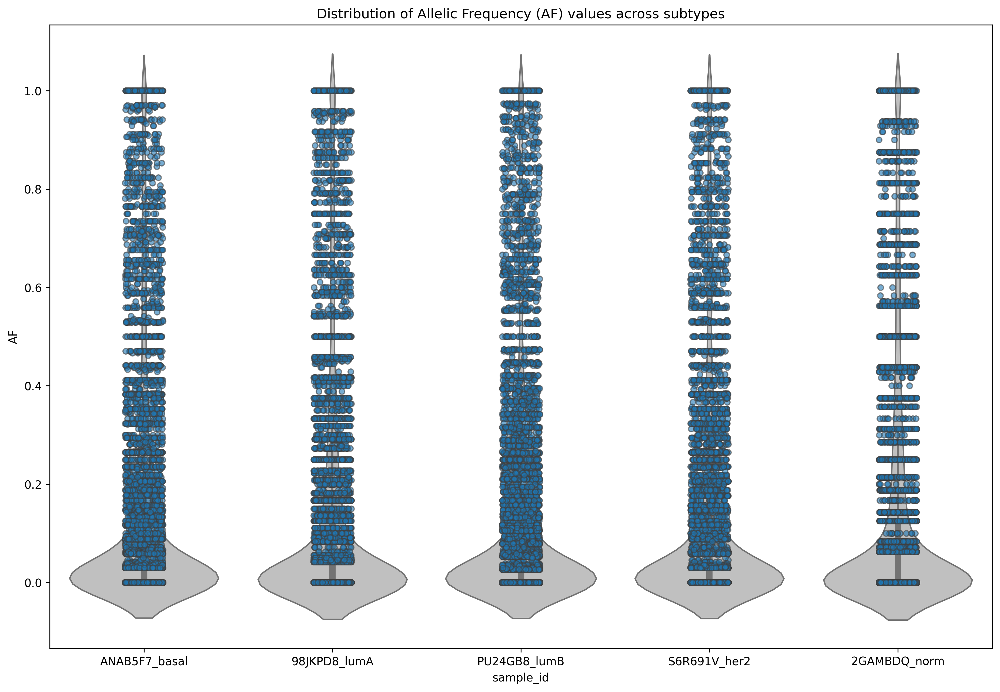

In [15]:
# visualize individual data points using a stripplot and scatterplot
fig, ax = plt.subplots(figsize=(15, 10), dpi=300)
sns.stripplot(x="sample_id", y="AF", data=af_regdf_long, jitter=True, alpha=0.6, linewidth=1, ax=ax)
sns.violinplot(x="sample_id", y="AF", data=af_regdf_long, color='silver', ax=ax)

plt.title("Distribution of Allelic Frequency (AF) values across subtypes")
plt.show()

In [16]:
af_region_df[af_region_df == 0].count()

region_id              0
ANAB5F7_basal_AF    4529
98JKPD8_lumA_AF     5425
PU24GB8_lumB_AF     4656
S6R691V_her2_AF     4736
2GAMBDQ_norm_AF     5858
dtype: int64

As seen above, about half of the observations/data points are equal to 0. This suggests a very left-skewed distribution tending towards zero. This makes sense because you would expect that most sites do not have allelic variants (AF = 0 indicates that there are zero reads in the current data that support the alternative allele).

What we can do next is to visualize the summary statistics of the AF distribution after excluding the zero values.

Text(0.5, 1.0, 'Distribution of Allelic Frequency across Called Variants in TFDP1_M08108_2.00 TFBS')

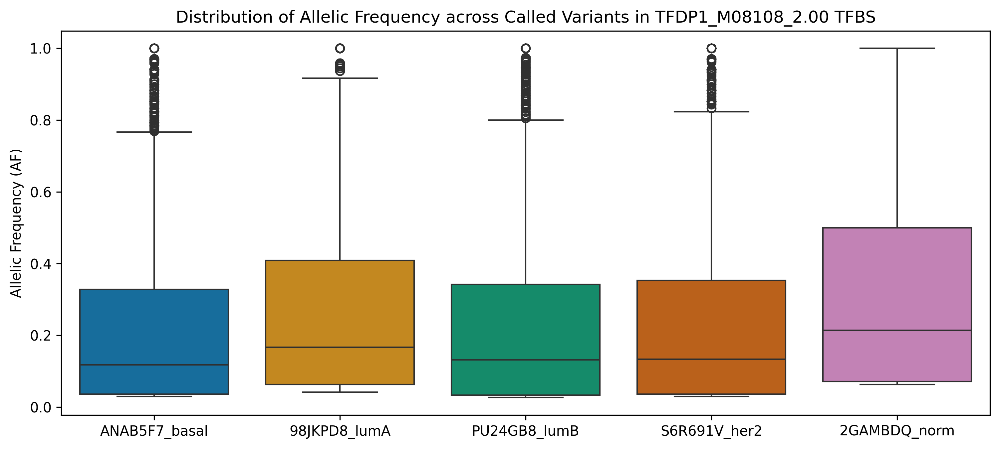

In [17]:
# exclude the zeroes
af_regdf_long_nozero = af_regdf_long[af_regdf_long.AF != 0]

# plot boxplot
plt.figure(figsize=(12,5), dpi=300)
sns.boxplot(data=af_regdf_long_nozero, x='sample_id', y='AF', hue='sample_id', palette='colorblind')

# add labels and title
plt.xlabel('')
plt.ylabel('Allelic Frequency (AF)')
plt.title('Distribution of Allelic Frequency across Called Variants in TFDP1_M08108_2.00 TFBS')


When zeroes are filtered out as shown below in the kernel density estimate plot below, the distribution of AF values that are not zeroes can be seen clearly, though it still remains left-skewed. There seems to be a bump at AF = 0.5. The AF distribution is inherently discretized in the strip plot, which makes sense because AF is a ratio derived from discrete counts of alleles. There is also a bump at AF = 1.0, which indicates that there are binding sites containing alternative allele (mutation) supported by 100% of the observed alleles across samples. They could be known SNPs, or they could be novel mutations associated with BRCA.

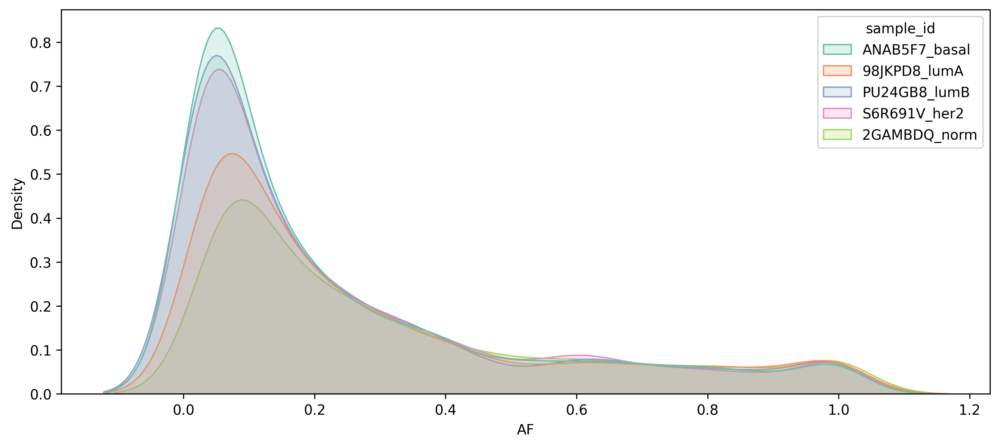

In [18]:
# filter out zero values
plt.figure(figsize=(12,5), dpi=300)
ax = sns.kdeplot(data=af_regdf_long_nozero, x='AF', hue='sample_id', fill=True, alpha=0.2, palette='Set2')

# Show the plot
plt.show()

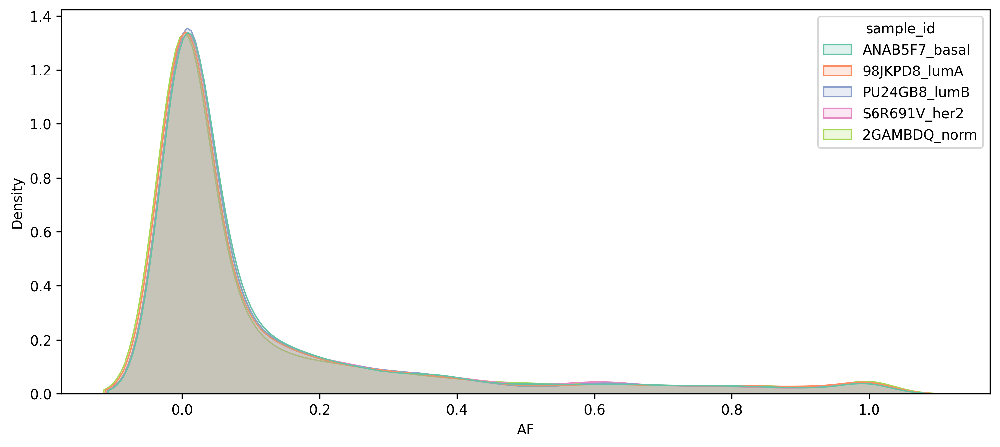

In [19]:
plt.figure(figsize=(12,5), dpi=300)
ax = sns.kdeplot(data=af_regdf_long, x='AF', hue='sample_id', fill=True, alpha=0.2, palette='Set2')

# Show the plot
plt.show()

We can also plot the AF distribution across TFBSs hued by the subtype as a scatterplot. This is to see if there are any differences in the AF distribution across subtypes.

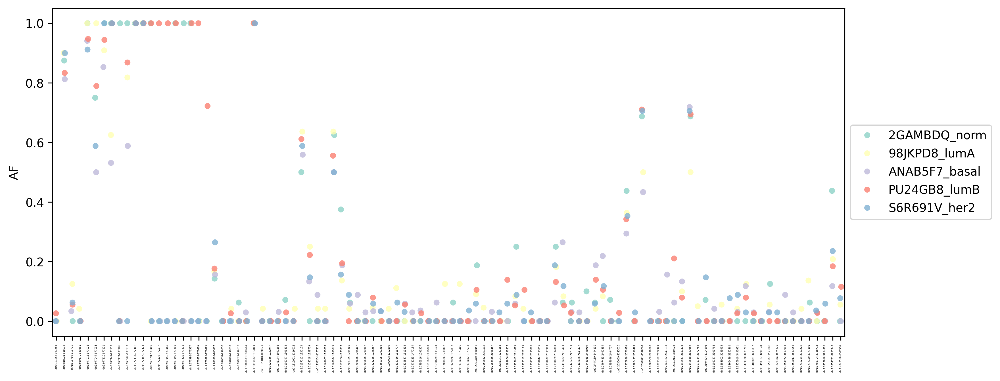

In [26]:
# group the data by 'sample_id' and select the first 100 entries from each group
data_to_plot = af_regdf_long.groupby('sample_id').apply(lambda x: x.head(100)).reset_index(drop=True)

# plot strip plot
plt.figure(figsize=(12,5), dpi=300)
ax = sns.stripplot(data=data_to_plot, y='AF', x='region_id', hue='sample_id', palette='Set3', alpha=0.8)
plt.xlabel("")
plt.xticks(rotation=90, fontsize=2)

# move the legend outside of the plot
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

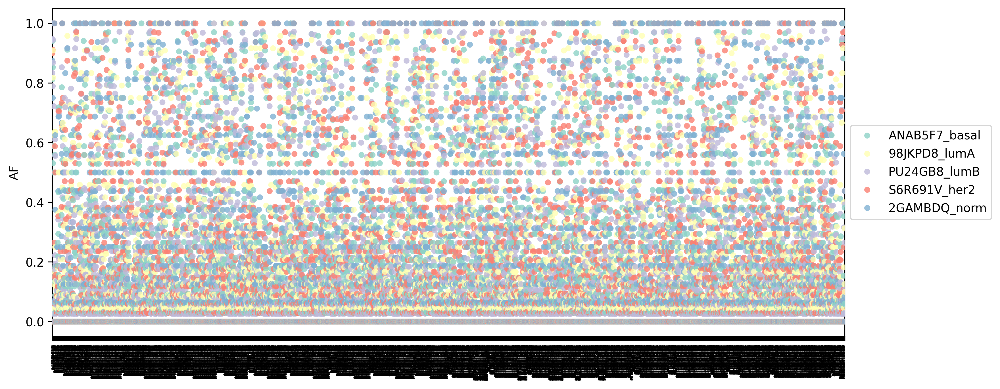

In [27]:
# plot strip plot
plt.figure(figsize=(12,5), dpi=300)
ax = sns.stripplot(data=af_regdf_long, y='AF', x='region_id', hue='sample_id', palette='Set3', alpha=0.8)
plt.xlabel("")
plt.xticks(rotation=90, fontsize=2)

# move the legend outside of the plot
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#### Z-score normalization (AF)
Let's try to normalize the data using Z-score normalization. 

In [17]:
# normalize the data
import scipy.stats as stats

In [26]:
af_region_df

,region_id,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
1,chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
2,chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
3,chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
4,chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...,...
9555,chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
9556,chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
9557,chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833
9558,chrX:155641610-155641621,0.0000,0.0000,0.0294,0.0000,0.0000


In [30]:
af_region_df.drop(columns='region_id')


,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,0.0000,0.0000,0.0263,0.0000,0.0000
1,0.8125,0.9000,0.8333,0.9000,0.8750
2,0.0333,0.1250,0.0556,0.0625,0.0000
3,0.0000,0.0417,0.0000,0.0000,0.0000
4,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...
9555,0.0000,0.0000,0.0000,0.0000,0.0625
9556,0.0588,0.1250,0.1053,0.0000,0.0000
9557,0.0000,0.3125,0.3929,0.1000,0.0833
9558,0.0000,0.0000,0.0294,0.0000,0.0000


In [19]:
af_region_df.describe()

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.1244,0.1242,0.1239,0.1260,0.1257
std,0.2257,0.2341,0.2284,0.2290,0.2388
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0000,0.0000,0.0000,0.0000,0.0000
50%,0.0294,0.0000,0.0263,0.0294,0.0000
75%,0.1333,0.1250,0.1316,0.1429,0.1250
max,1.0000,1.0000,1.0000,1.0000,1.0000


Now let's apply the Z-score normalization to the AF data along each column (across the rows, axis = 0). 

In [32]:
test_df = af_region_df.set_index('region_id')
test_df['ana_zscore'] = (test_df['ANAB5F7_basal_AF'] - test_df['ANAB5F7_basal_AF'].mean())/test_df['ANAB5F7_basal_AF'].std(ddof=0)
test_df

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,ana_zscore
region_id,,,,,,
chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000,-0.5513
chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750,3.0481
chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000,-0.4036
chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000,-0.5513
chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000,3.6181
...,...,...,...,...,...,...
chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625,-0.5513
chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000,-0.2907
chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833,-0.5513


In [36]:
af_region_dfz = af_region_df.set_index('region_id').apply(stats.zscore, axis=0, ddof=0)
af_region_dfz

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:191257-191268,-0.5513,-0.5307,-0.4273,-0.5501,-0.5266
chr1:818021-818032,3.0481,3.3136,3.1062,3.3807,3.1382
chr1:818780-818791,-0.4036,0.0032,-0.2993,-0.2772,-0.5266
chr1:960570-960581,-0.5513,-0.3527,-0.5426,-0.5501,-0.5266
chr1:977015-977026,3.6181,3.7407,3.6056,3.4321,3.6617
...,...,...,...,...,...
chrX:153934861-153934872,-0.5513,-0.5307,-0.5426,-0.5501,-0.2648
chrX:154444629-154444640,-0.2907,0.0032,-0.0817,-0.5501,-0.5266
chrX:155010397-155010408,-0.5513,0.8041,1.1776,-0.1134,-0.1776


It is clear from the two ways of calculating zscores above that they are similar. 

In [37]:
af_region_dfz.describe()

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.0000,-0.0000,-0.0000,-0.0000,-0.0000
std,1.0001,1.0001,1.0001,1.0001,1.0001
min,-0.5513,-0.5307,-0.5426,-0.5501,-0.5266
25%,-0.5513,-0.5307,-0.5426,-0.5501,-0.5266
50%,-0.4210,-0.5307,-0.4273,-0.4217,-0.5266
75%,0.0394,0.0032,0.0336,0.0738,-0.0030
max,3.8787,3.7407,3.8360,3.8175,3.6617


<Axes: ylabel='Density'>

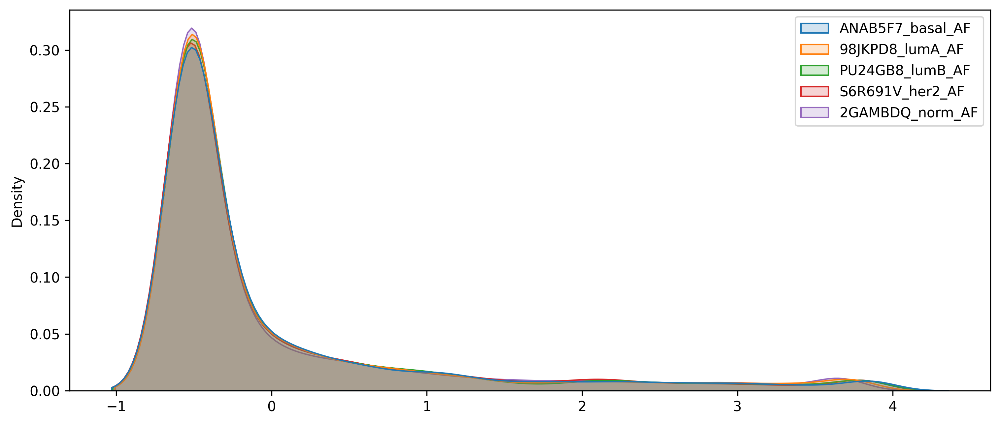

In [38]:
# plot distribution of normalized data
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=af_region_dfz, fill=True, alpha=0.2)
# sns.kdeplot(data=af_region_df.drop(columns='region_id'), fill=True, alpha=1)

In [50]:
# Let's set a upper threshold of 3; lower threshold is not relevant since we are only interested in variants with AF > 0
# create a mask that is True for each element whose value is >= 1
# then use any to create a row-wise mask to index the original dataframe

mask = (af_region_dfz >= 3)
mask = mask.any(axis=1)
mask
# use the row-wise mask to index, and replace values not less than -1 or more than 1 with np.nan using where method
afz_filt_result = af_region_dfz[mask].where((af_region_dfz >= 3), np.nan)
afz_filt_result


,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:818021-818032,3.0481,3.3136,3.1062,3.3807,3.1382
chr1:977015-977026,3.6181,3.7407,3.6056,3.4321,3.6617
chr1:977047-977058,NaN,3.7407,NaN,NaN,NaN
chr1:977110-977121,3.2272,3.3524,3.5928,3.8175,3.6617
chr1:977142-977153,NaN,NaN,3.8360,3.8175,3.6617
...,...,...,...,...,...
chrX:128606906-128606917,3.8787,3.7407,3.8360,3.8175,3.6617
chrX:128928955-128928966,3.5623,3.0288,3.6171,3.5055,3.6617
chrX:130110575-130110586,3.8787,3.7407,3.8360,3.8175,3.6617


<Axes: ylabel='Density'>

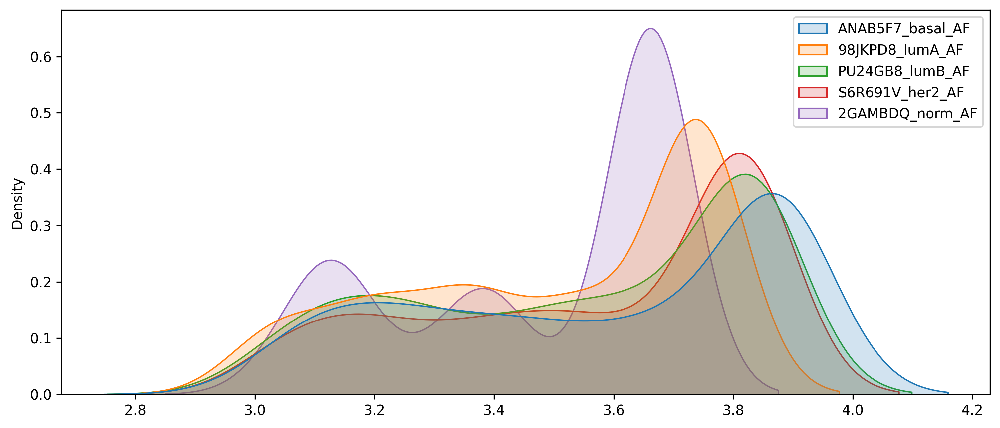

In [51]:
# plot distribution of normalized data
plt.figure(figsize=(12,5), dpi=300)
sns.kdeplot(data=afz_filt_result, fill=True, alpha=0.2)

Plot heatmap across normalized filtered AF data.

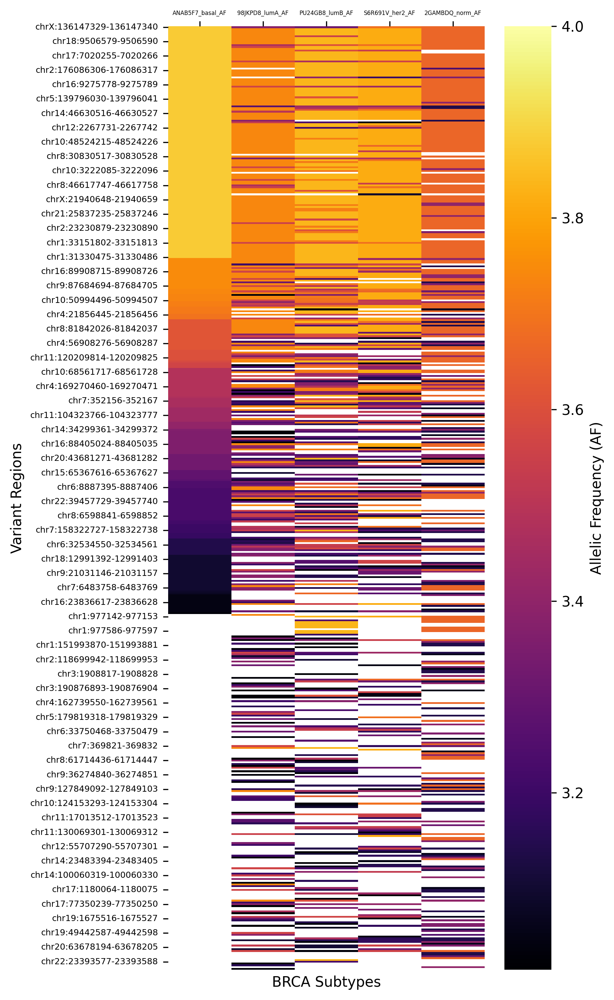

In [54]:
# plot distribution across subtypes as heatmap
plt.figure(figsize=(5,12), dpi=300)
ax = sns.heatmap(data=afz_filt_result.sort_values(by=['ANAB5F7_basal_AF'],ascending=False), cmap='inferno', vmax=4, cbar_kws={'label': 'Allelic Frequency (AF)'})
ax.set_ylabel('Variant Regions')
ax.set_xlabel('BRCA Subtypes')
# set smaller font size for column labels
ax.tick_params(axis='x', labelsize=4)
ax.tick_params(axis='y', labelsize=6)
ax.xaxis.tick_top()

plt.show()

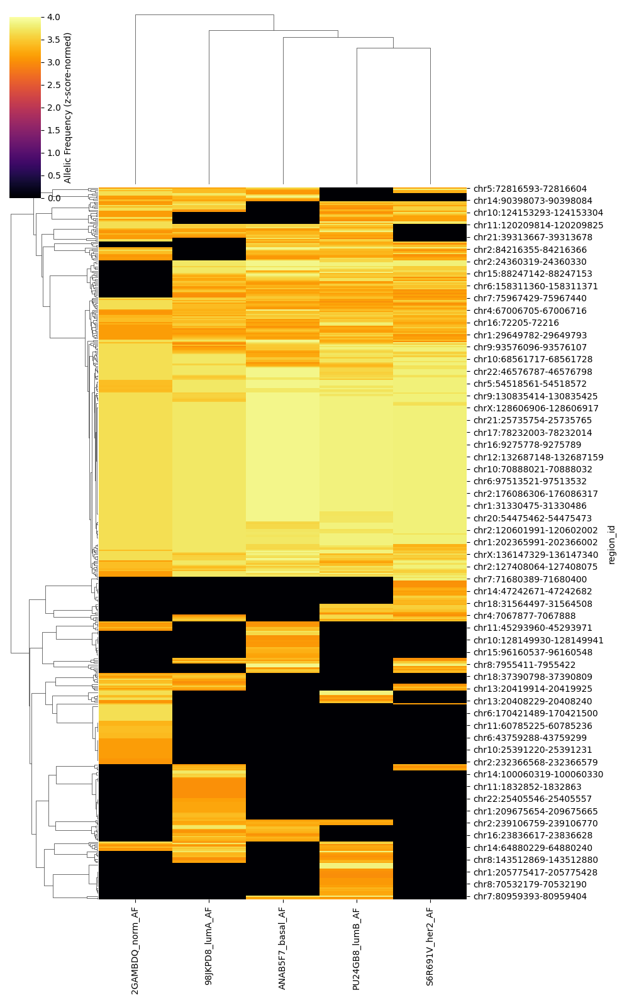

In [78]:
# try clustering the heatmap
# fill the NaN values with 0

ax = sns.clustermap(data=afz_filt_result.fillna(0), cmap='inferno', vmax=4, cbar_kws={'label': 'Allelic Frequency (z-score-normed)'}, figsize=(10,16))
plt.show()

The `afz_filt_result` dataframe will be used to merge with the FPS data. Let's load up the FPS data and merge it with the `afz_filt_result` dataframe.

### Filtering AF Dataset (unnormalized: Alternative Processing Strategy)

In [81]:
af_region_dfn = af_region_df
af_region_dfn

,region_id,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
1,chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
2,chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
3,chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
4,chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...,...
9555,chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
9556,chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
9557,chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833
9558,chrX:155641610-155641621,0.0000,0.0000,0.0294,0.0000,0.0000


In [82]:
af_region_dfn.describe()

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.1244,0.1242,0.1239,0.1260,0.1257
std,0.2257,0.2341,0.2284,0.2290,0.2388
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0000,0.0000,0.0000,0.0000,0.0000
50%,0.0294,0.0000,0.0263,0.0294,0.0000
75%,0.1333,0.1250,0.1316,0.1429,0.1250
max,1.0000,1.0000,1.0000,1.0000,1.0000


DEPRECATED STEP: ~~Split the dataframes into five sub-dataframes with 'region_id' as the common column. Then filter the dataframes to retain only AF values that are greater than 0.5.~~

In [ ]:
# # first we need to split the dataframe into 5 dataframes, one for each subtype, with region_id as common column
# # get a list of all column names except 'region_id'
# cols = [col for col in af_region_dfn.columns if col != 'region_id']
# print(cols)
# # create a dictionary to store the sub-dataframes
# subdfs = {}

# # create sub-dataframes
# for col in cols:
#     subdfs[col] = af_region_dfn[['region_id', col]]
    
# # filter subdfs for when AF > 0.5
# for subtype, df in subdfs.items():
# 	subdfs[subtype] = df[df[subtype] > 0.5]

# subdfs

# # define the color palette
# palette = sns.color_palette("Set3", 5)

# # define plotting regions for subplots
# fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(15, 10), dpi=300)

# # define the color palette
# palette = sns.color_palette("Set3", 5)

# for index, (subtype, df) in enumerate(subdfs.items()):
# 	sns.kdeplot(data=df, x=subtype, fill=True, alpha=0.2, ax=axes[index], color=palette[index], legend=True)
# 	axes[index].set_xlabel(subtype)
  

# plt.tight_layout()
# plt.show()

# # now merge the sub-dataframes back into one dataframe, on region_id, with NaN values filled with -1
# from functools import reduce

# # assuming subdfs is your dictionary of dataframes
# dfs = list(subdfs.values())

# # use reduce to merge all dataframes
# merged_af_df = reduce(lambda left,right: pd.merge(left,right,on='region_id', how='outer'), dfs)

# # fill NaN values with -1
# # merged_af_df.fillna(-1, inplace=True)

# merged_af_df

# # set region_id as index
# merged_af_df_indexed = merged_af_df.set_index('region_id')
# merged_af_df_indexed

#### Updated Approach:

Instead of splitting the dataframes into five sub-dataframes, we can also use use boolean masking to filter the main dataframe rows meeting a condition and then use the `.where()` replacement method to replace values in each passing row with a new value. 

We also changed the thresholding condition from 'greater than' to 'greater than or equal to'. 


In [83]:
af_region_dfn

,region_id,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
0,chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
1,chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
2,chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
3,chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
4,chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...,...
9555,chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
9556,chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
9557,chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833
9558,chrX:155641610-155641621,0.0000,0.0000,0.0294,0.0000,0.0000


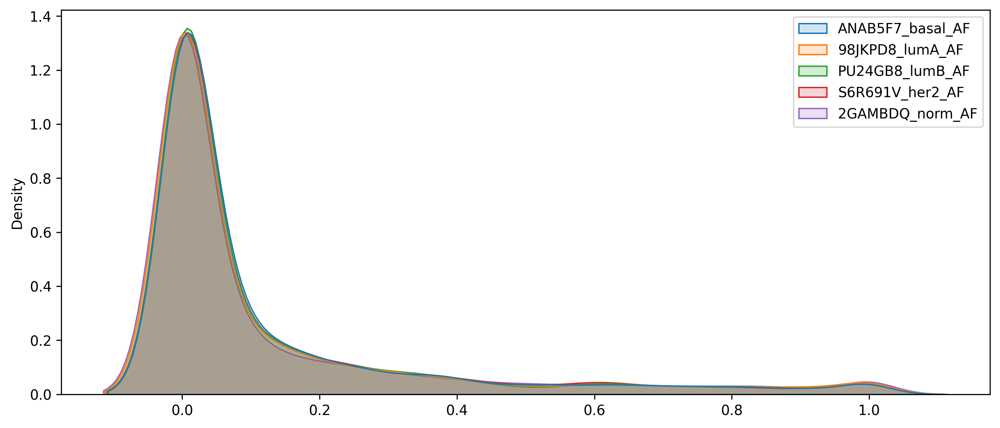

In [85]:
# plot kdeplot
plt.figure(figsize=(12,5), dpi=300)
ax = sns.kdeplot(data=af_region_dfn, fill=True, alpha=0.2)
plt.show()

In [84]:
# set region_id as index
af_region_dfn_ind = af_region_dfn.set_index('region_id')
af_region_dfn_ind

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...
chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833


In [86]:
# create a mask that is True for rows where at least one value is >= 0.5
mask = af_region_dfn_ind.ge(0.5).any(axis=1)

# use the mask to index the DataFrame, and replace values < 0.5 with 0
af_filt_result = af_region_dfn_ind[mask].where(af_region_dfn_ind >= 0.5, np.nan)
af_filt_result

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
chr1:977047-977058,0.5000,1.0000,0.7895,0.5882,0.7500
chr1:977110-977121,0.8529,0.9091,0.9444,1.0000,1.0000
chr1:977142-977153,0.5312,0.6250,1.0000,1.0000,1.0000
...,...,...,...,...,...
chrX:128928955-128928966,0.9286,0.8333,0.9500,0.9286,1.0000
chrX:130110575-130110586,1.0000,1.0000,1.0000,1.0000,1.0000
chrX:136147329-136147340,1.0000,0.9167,0.8824,0.9706,1.0000


Plot the heatmap across filtered data.

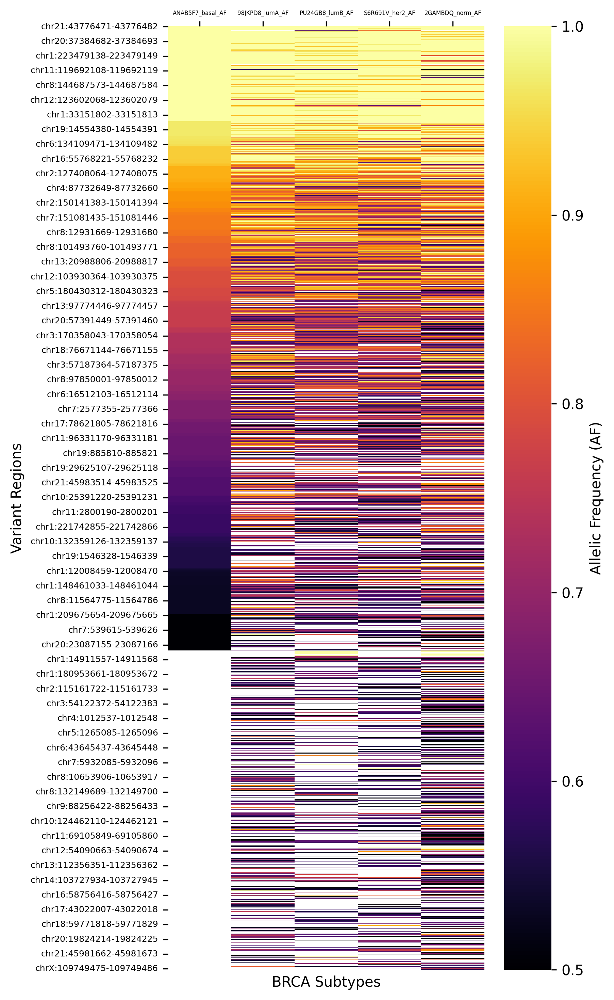

In [50]:
# plot distribution across subtypes as heatmap
plt.figure(figsize=(5,12), dpi=300)
ax = sns.heatmap(data=af_filt_result.sort_values(by=['ANAB5F7_basal_AF'],ascending=False), cmap='inferno', cbar_kws={'label': 'Allelic Frequency (AF)'})
ax.set_ylabel('Variant Regions')
ax.set_xlabel('BRCA Subtypes')
# set smaller font size for column labels
ax.tick_params(axis='x', labelsize=4)
ax.tick_params(axis='y', labelsize=6)
ax.xaxis.tick_top()

plt.show()

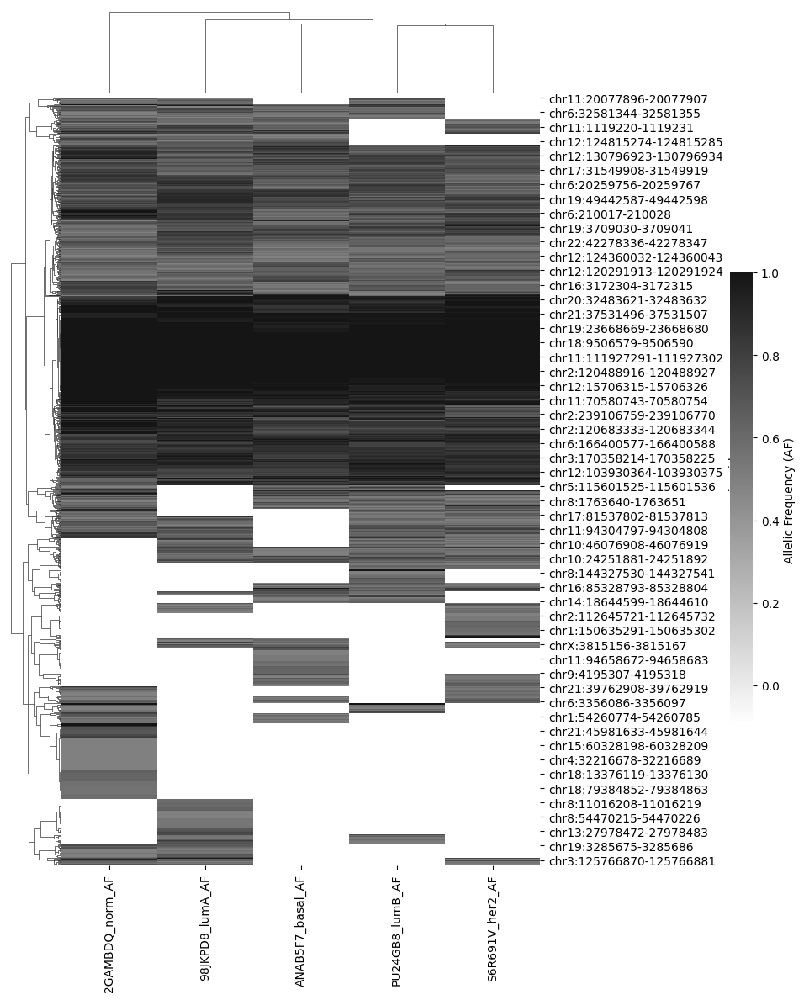

In [87]:
# fill NaN values with -0.1 first to avoid seaborn error
af_filt_result_fna = af_filt_result.fillna(-0.1)

g = sns.clustermap(data=af_filt_result_fna, cmap='binary', cbar_kws={'label': 'Allelic Frequency (AF)'}, center=0.5, figsize=(9,12), dendrogram_ratio=0.1)

# calculate colorbar position
fig_height = g.fig.get_figheight()
cbar_height = 0.45 * fig_height  # 45% of figure height
cbar_bottom = (fig_height - cbar_height) / 2 / fig_height  # center vertically

# reposition colorbar
g.cax.set_position([.97, cbar_bottom, .03, cbar_height / fig_height])


plt.show()

The `af_filt_result` dataframe will be used to merge with the FPS data. Let's load up the FPS data and merge it with the `af_filt_result` dataframe.

### Plotting Footprinting Scores (FPS)

Now let's subset the filtered gr object into a dataframe containing only the FPS data. 

Then, we can plot the FPS distribution for each subtype.

In [189]:
# subset the dataframe to gget just the _fps columns
fps_region_df = final_df.filter(regex='_fps$|_id$')
fps_region_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,region_id
0,0.0000,0.0000,0.0000,0.0000,0.0000,chr1:191257-191268
1,0.0297,0.0440,0.0213,0.0347,0.0344,chr1:818021-818032
2,0.0257,0.0238,0.0227,0.0281,0.0339,chr1:818780-818791
3,0.2805,0.3350,0.2849,0.2762,0.2299,chr1:960570-960581
4,1.1005,0.5051,0.7104,1.2130,1.3015,chr1:977015-977026
...,...,...,...,...,...,...
9555,0.1967,0.1679,0.1721,0.1905,0.1616,chrX:153934861-153934872
9556,0.0490,0.0743,0.0731,0.0901,0.0423,chrX:154444629-154444640
9557,0.0118,0.0050,0.0088,0.0130,0.0199,chrX:155010397-155010408
9558,0.0125,0.0124,0.0133,0.0149,0.0174,chrX:155641610-155641621


In [190]:
# see summary statistics
fps_region_df.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.1556,0.1576,0.1485,0.1620,0.1537
std,0.3098,0.3090,0.3030,0.3298,0.2982
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0180,0.0163,0.0185,0.0193,0.0217
50%,0.0349,0.0372,0.0370,0.0366,0.0379
75%,0.1320,0.1380,0.1219,0.1344,0.1304
max,3.7916,3.9361,7.6509,3.6747,3.7641


In [191]:
# this is actually in a wide format, so we need to melt it into a long format for plotting
fps_df_long = fps_region_df.melt(id_vars=["region_id"], var_name="sample_id", value_name="FPS")
# remove the "_fps" suffix from the "sample_id" column
fps_df_long["sample_id"] = fps_df_long["sample_id"].apply(lambda x: x.replace("_fps", ""))
fps_df_long

,region_id,sample_id,FPS
0,chr1:191257-191268,98JKPD8_lumA,0.0000
1,chr1:818021-818032,98JKPD8_lumA,0.0297
2,chr1:818780-818791,98JKPD8_lumA,0.0257
3,chr1:960570-960581,98JKPD8_lumA,0.2805
4,chr1:977015-977026,98JKPD8_lumA,1.1005
...,...,...,...
47795,chrX:153934861-153934872,2GAMBDQ_norm,0.1616
47796,chrX:154444629-154444640,2GAMBDQ_norm,0.0423
47797,chrX:155010397-155010408,2GAMBDQ_norm,0.0199
47798,chrX:155641610-155641621,2GAMBDQ_norm,0.0174


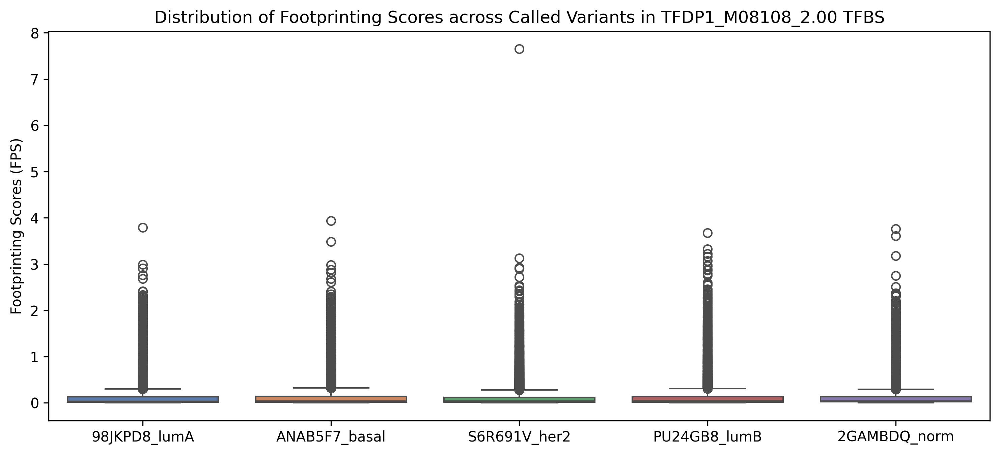

In [192]:
# plot boxplot
plt.figure(figsize=(12,5), dpi=300)
sns.boxplot(data=fps_df_long, x='sample_id', y='FPS', hue='sample_id', palette='deep')

# add labels and title
plt.xlabel('')
plt.ylabel('Footprinting Scores (FPS)')
plt.title('Distribution of Footprinting Scores across Called Variants in TFDP1_M08108_2.00 TFBS')
plt.show()

There is an extreme outlier pushing every data point down to zero. Let's use MinMaxScaler to scale the data to a range between 0 and 1.

In [193]:
from sklearn.preprocessing import MinMaxScaler

In [194]:
# first, set 'region_id' as index
fps_region_df_ind = fps_region_df.set_index('region_id')
fps_region_df_ind

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:818021-818032,0.0297,0.0440,0.0213,0.0347,0.0344
chr1:818780-818791,0.0257,0.0238,0.0227,0.0281,0.0339
chr1:960570-960581,0.2805,0.3350,0.2849,0.2762,0.2299
chr1:977015-977026,1.1005,0.5051,0.7104,1.2130,1.3015
...,...,...,...,...,...
chrX:153934861-153934872,0.1967,0.1679,0.1721,0.1905,0.1616
chrX:154444629-154444640,0.0490,0.0743,0.0731,0.0901,0.0423
chrX:155010397-155010408,0.0118,0.0050,0.0088,0.0130,0.0199


In [195]:
# set scaler object to scale values between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))

fps_region_df_ind_scaled = scaler.fit_transform(fps_region_df_ind)

# convert back to dataframe
fps_region_df_ind_scaled = pd.DataFrame(fps_region_df_ind_scaled, columns=fps_region_df_ind.columns, index=fps_region_df_ind.index)
fps_region_df_ind_scaled

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:818021-818032,0.0078,0.0112,0.0028,0.0094,0.0091
chr1:818780-818791,0.0068,0.0060,0.0030,0.0077,0.0090
chr1:960570-960581,0.0740,0.0851,0.0372,0.0752,0.0611
chr1:977015-977026,0.2902,0.1283,0.0928,0.3301,0.3458
...,...,...,...,...,...
chrX:153934861-153934872,0.0519,0.0427,0.0225,0.0518,0.0429
chrX:154444629-154444640,0.0129,0.0189,0.0096,0.0245,0.0112
chrX:155010397-155010408,0.0031,0.0013,0.0011,0.0035,0.0053


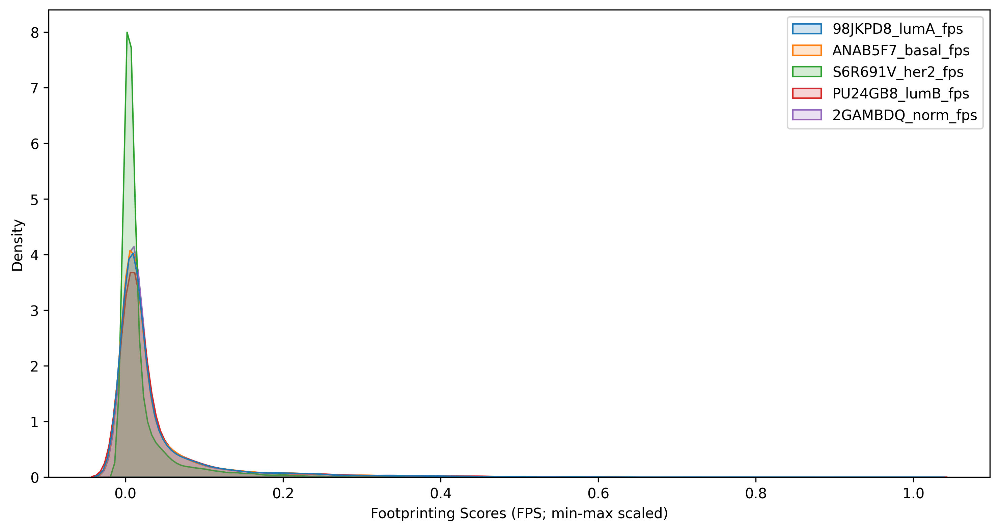

In [196]:
# plot distribution across subtypes as kdeplot
plt.figure(figsize=(12,6), dpi=300)
ax = sns.kdeplot(data=fps_region_df_ind_scaled, fill=True, alpha=0.2)
ax.set_xlabel('Footprinting Scores (FPS; min-max scaled)')

plt.show()

In [197]:
fps_region_df_ind_scaled.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.0410,0.0401,0.0194,0.0441,0.0408
std,0.0817,0.0785,0.0396,0.0897,0.0792
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0047,0.0041,0.0024,0.0053,0.0058
50%,0.0092,0.0094,0.0048,0.0100,0.0101
75%,0.0348,0.0350,0.0159,0.0366,0.0346
max,1.0000,1.0000,1.0000,1.0000,1.0000


The skewed distribution and the extreme outlier makes deciding a cutoff based on the mean value quite tricky. Let's use the interquartile range; anything above the 75th percentile and below the 25th percentile will be considered interesting.



In [198]:
# Let's set a lower threshold of 0.004 and upper threshold of 0.04
# create a mask that is True for each element whose value is <= 0.0044 or >= 0.04
# then use any to create a row-wise mask to index the original dataframe

mask = (fps_region_df_ind_scaled <= 0.004) | (fps_region_df_ind_scaled >= 0.04)
mask = mask.any(axis=1)

# use the row-wise mask to index, and replace values not less than 0.005 or more than 0.04 with np.nan using where method
fps_scaled_filt_result = fps_region_df_ind_scaled[mask].where((fps_region_df_ind_scaled <= 0.004) | (fps_region_df_ind_scaled >= 0.04), np.nan)
fps_scaled_filt_result

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:818021-818032,NaN,NaN,0.0028,NaN,NaN
chr1:818780-818791,NaN,NaN,0.0030,NaN,NaN
chr1:960570-960581,0.0740,0.0851,NaN,0.0752,0.0611
chr1:977015-977026,0.2902,0.1283,0.0928,0.3301,0.3458
...,...,...,...,...,...
chrX:153885794-153885805,NaN,NaN,0.0025,NaN,NaN
chrX:153934861-153934872,0.0519,0.0427,NaN,0.0518,0.0429
chrX:155010397-155010408,0.0031,0.0013,0.0011,0.0035,NaN


### Alternative FPS Data Filtering Strategy
We can try removing the one outlier in her2 subtype and see if the distribution of FPS values will be more interpretable.


In [100]:
# first, set 'region_id' as index
fps_region_df_ind = fps_region_df.set_index('region_id')
fps_region_df_ind

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:818021-818032,0.0297,0.0440,0.0213,0.0347,0.0344
chr1:818780-818791,0.0257,0.0238,0.0227,0.0281,0.0339
chr1:960570-960581,0.2805,0.3350,0.2849,0.2762,0.2299
chr1:977015-977026,1.1005,0.5051,0.7104,1.2130,1.3015
...,...,...,...,...,...
chrX:153934861-153934872,0.1967,0.1679,0.1721,0.1905,0.1616
chrX:154444629-154444640,0.0490,0.0743,0.0731,0.0901,0.0423
chrX:155010397-155010408,0.0118,0.0050,0.0088,0.0130,0.0199


In [101]:
fps_region_df_ind.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9560.0000,9560.0000,9560.0000,9560.0000,9560.0000
mean,0.1556,0.1576,0.1485,0.1620,0.1537
std,0.3098,0.3090,0.3030,0.3298,0.2982
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0180,0.0163,0.0185,0.0193,0.0217
50%,0.0349,0.0372,0.0370,0.0366,0.0379
75%,0.1320,0.1380,0.1219,0.1344,0.1304
max,3.7916,3.9361,7.6509,3.6747,3.7641


In [102]:
# set fps value above 5 to NaN
fps_region_df_ind[fps_region_df_ind > 5] = np.nan
# show the row with NaN values
fps_region_df_ind[fps_region_df_ind.isnull().any(axis=1)]


,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr17:39980517-39980528,2.1407,2.2327,NaN,2.5429,2.3037


In [103]:
fps_region_df_ind.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9560.0000,9560.0000,9559.0000,9560.0000,9560.0000
mean,0.1556,0.1576,0.1477,0.1620,0.1537
std,0.3098,0.3090,0.2931,0.3298,0.2982
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0180,0.0163,0.0185,0.0193,0.0217
50%,0.0349,0.0372,0.0370,0.0366,0.0379
75%,0.1320,0.1380,0.1218,0.1344,0.1304
max,3.7916,3.9361,3.1313,3.6747,3.7641


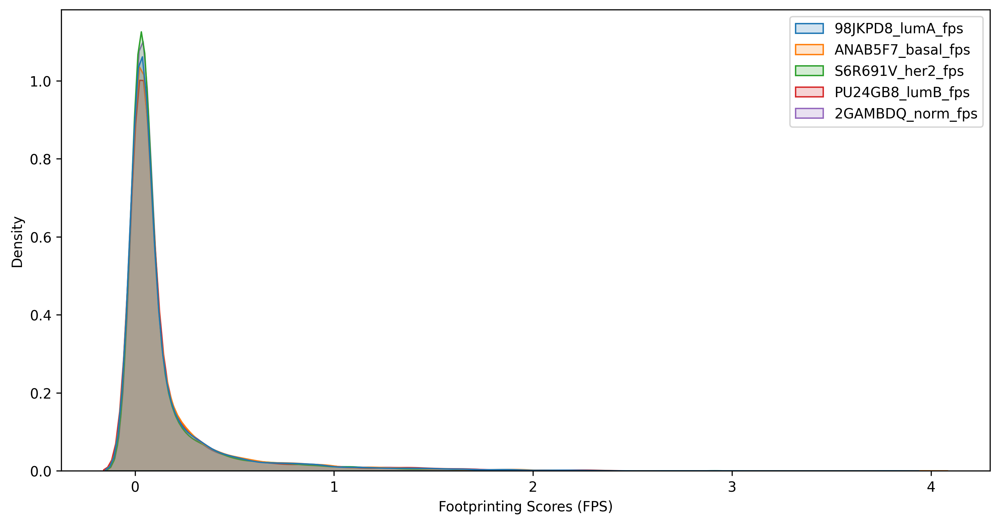

In [104]:
# plot kde
plt.figure(figsize=(12,6), dpi=300)
ax = sns.kdeplot(data=fps_region_df_ind, fill=True, alpha=0.2)
ax.set_xlabel('Footprinting Scores (FPS)')
plt.show()

Now, normalize the FPS data with z-score normalization. Make sure to drop the row with the big outlier first.

In [106]:
# normalize using z-score
import scipy.stats as stats
# first exclude the row with NaN values
fps_region_df_ind_nonan = fps_region_df_ind.dropna()
fps_region_df_ind_nonan

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:818021-818032,0.0297,0.0440,0.0213,0.0347,0.0344
chr1:818780-818791,0.0257,0.0238,0.0227,0.0281,0.0339
chr1:960570-960581,0.2805,0.3350,0.2849,0.2762,0.2299
chr1:977015-977026,1.1005,0.5051,0.7104,1.2130,1.3015
...,...,...,...,...,...
chrX:153934861-153934872,0.1967,0.1679,0.1721,0.1905,0.1616
chrX:154444629-154444640,0.0490,0.0743,0.0731,0.0901,0.0423
chrX:155010397-155010408,0.0118,0.0050,0.0088,0.0130,0.0199


In [107]:
fps_region_df_ind_nonan.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9559.0000,9559.0000,9559.0000,9559.0000,9559.0000
mean,0.1553,0.1574,0.1477,0.1618,0.1534
std,0.3092,0.3083,0.2931,0.3289,0.2974
min,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0180,0.0163,0.0185,0.0193,0.0217
50%,0.0349,0.0372,0.0370,0.0366,0.0379
75%,0.1320,0.1378,0.1218,0.1341,0.1303
max,3.7916,3.9361,3.1313,3.6747,3.7641


In [108]:
fps_region_dfz = fps_region_df_ind_nonan.apply(stats.zscore, axis=0, ddof=0)
fps_region_dfz

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,-0.5025,-0.5106,-0.5040,-0.4919,-0.5159
chr1:818021-818032,-0.4066,-0.3679,-0.4313,-0.3864,-0.4002
chr1:818780-818791,-0.4193,-0.4335,-0.4265,-0.4063,-0.4019
chr1:960570-960581,0.4047,0.5760,0.4682,0.3479,0.2570
chr1:977015-977026,3.0572,1.1278,1.9196,3.1965,3.8606
...,...,...,...,...,...
chrX:153934861-153934872,0.1338,0.0340,0.0833,0.0872,0.0275
chrX:154444629-154444640,-0.3440,-0.2696,-0.2547,-0.2178,-0.3736
chrX:155010397-155010408,-0.4644,-0.4945,-0.4741,-0.4524,-0.4491


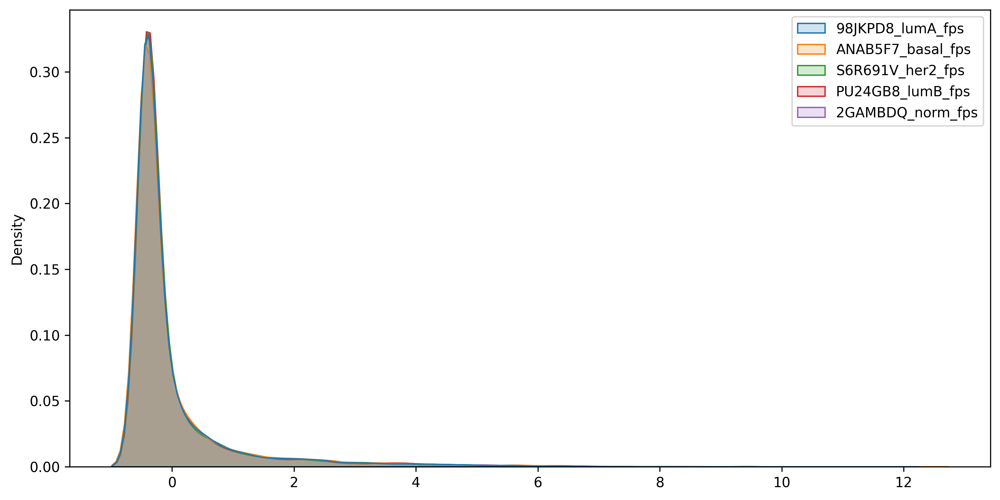

In [110]:
# plot kde
plt.figure(figsize=(12,6), dpi=300)
ax = sns.kdeplot(data=fps_region_dfz, fill=True, alpha=0.2)

plt.show()

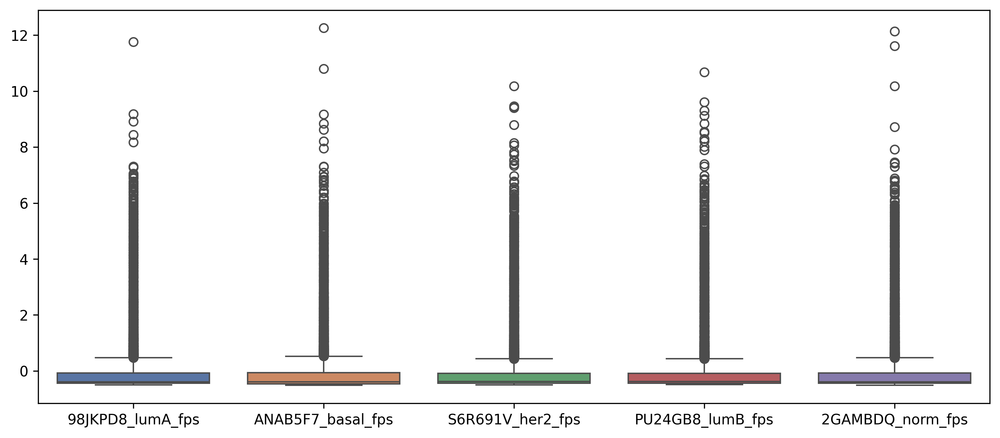

In [120]:
#box plot
plt.figure(figsize=(12,5), dpi=300)
sns.boxplot(data=fps_region_dfz, palette='deep')
plt.xlabel('')
plt.show()

In [174]:
fps_region_dfz.describe()

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
count,9559.0000,9559.0000,9559.0000,9559.0000,9559.0000
mean,-0.0000,-0.0000,0.0000,-0.0000,-0.0000
std,1.0001,1.0001,1.0001,1.0001,1.0001
min,-0.5025,-0.5106,-0.5040,-0.4919,-0.5159
25%,-0.4444,-0.4578,-0.4407,-0.4331,-0.4431
50%,-0.3897,-0.3900,-0.3777,-0.3807,-0.3886
75%,-0.0756,-0.0635,-0.0883,-0.0840,-0.0777
max,11.7620,12.2559,10.1794,10.6813,12.1411


It is a bit tricky to set a filtering cutoff because of the skewed distribution so I use the IQR for the cutoff.

In [175]:
# Let's set a lower threshold of -0.5 and upper threshold of -0.08
# create a mask that is True for each element whose value is >= -0.5 or <= -0.08
# then use any to create a row-wise mask to index the original dataframe

mask = (fps_region_dfz <= -0.5) | (fps_region_dfz >= -0.08)
mask = mask.any(axis=1)

# use the row-wise mask to index, and replace values not less than 0.005 or more than 0.04 with np.nan using where method
fps_dfz_filt_result = fps_region_dfz[mask].where((fps_region_dfz <= -0.5) | (fps_region_dfz >= -0.08), np.nan)
fps_dfz_filt_result

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,-0.5025,-0.5106,-0.5040,NaN,-0.5159
chr1:960570-960581,0.4047,0.5760,0.4682,0.3479,0.2570
chr1:977015-977026,3.0572,1.1278,1.9196,3.1965,3.8606
chr1:977047-977058,2.3498,0.8184,1.3102,2.5070,3.0854
chr1:977110-977121,-0.0776,NaN,NaN,0.0193,0.0050
...,...,...,...,...,...
chrX:139201111-139201122,0.0495,NaN,0.2265,NaN,-0.0614
chrX:150364468-150364479,NaN,0.1170,-0.0220,NaN,NaN
chrX:150364541-150364552,NaN,0.0442,NaN,NaN,NaN


### Combining AF and FPS data

Now we can explore both the AF and FPS dataframes.

In [199]:
af_region_dfn_ind

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0263,0.0000,0.0000
chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
chr1:818780-818791,0.0333,0.1250,0.0556,0.0625,0.0000
chr1:960570-960581,0.0000,0.0417,0.0000,0.0000,0.0000
chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
...,...,...,...,...,...
chrX:153934861-153934872,0.0000,0.0000,0.0000,0.0000,0.0625
chrX:154444629-154444640,0.0588,0.1250,0.1053,0.0000,0.0000
chrX:155010397-155010408,0.0000,0.3125,0.3929,0.1000,0.0833


In [200]:
fps_region_df_ind_scaled

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:818021-818032,0.0078,0.0112,0.0028,0.0094,0.0091
chr1:818780-818791,0.0068,0.0060,0.0030,0.0077,0.0090
chr1:960570-960581,0.0740,0.0851,0.0372,0.0752,0.0611
chr1:977015-977026,0.2902,0.1283,0.0928,0.3301,0.3458
...,...,...,...,...,...
chrX:153934861-153934872,0.0519,0.0427,0.0225,0.0518,0.0429
chrX:154444629-154444640,0.0129,0.0189,0.0096,0.0245,0.0112
chrX:155010397-155010408,0.0031,0.0013,0.0011,0.0035,0.0053


In [154]:
# merge the two dataframes on region_id row index
merged_affps_df = pd.merge(af_region_dfn_ind, fps_region_df_ind_scaled, left_index=True, right_index=True, how='outer')

# convert to long format
merged_affps_dfl = merged_affps_df.reset_index().melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
merged_affps_dfl[['sample_id', 'type']] = merged_affps_dfl['variable'].str.rsplit('_', n=1, expand=True)

# drop the redundant 'variable' column
merged_affps_dfl = merged_affps_dfl.drop(columns=["variable"])

# now pivot the dataframe to create new columns based on the type column
merged_affps_df_lpv = merged_affps_dfl.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# rename the columns to match the type values
merged_affps_df_lpv = merged_affps_df_lpv.rename(columns={'fps': 'scaled_footprint_score', 'AF': 'allelic_freq'})
merged_affps_df_lpv

type,region_id,sample_id,allelic_freq,scaled_footprint_score
0,chr10:100346639-100346650,2GAMBDQ_norm,0.0000,0.0507
1,chr10:100346639-100346650,98JKPD8_lumA,0.0000,0.0392
2,chr10:100346639-100346650,ANAB5F7_basal,0.0000,0.0453
3,chr10:100346639-100346650,PU24GB8_lumB,0.0000,0.0800
4,chr10:100346639-100346650,S6R691V_her2,0.0000,0.0282
...,...,...,...,...
47795,chrY:11108019-11108030,2GAMBDQ_norm,0.4375,0.0000
47796,chrY:11108019-11108030,98JKPD8_lumA,0.1000,0.0000
47797,chrY:11108019-11108030,ANAB5F7_basal,0.3824,0.0000
47798,chrY:11108019-11108030,PU24GB8_lumB,0.2647,0.0000


In [155]:
merged_affps_df_lpv[merged_affps_df_lpv['sample_id'] == 'ANAB5F7_basal']

type,region_id,sample_id,allelic_freq,scaled_footprint_score
2,chr10:100346639-100346650,ANAB5F7_basal,0.0000,0.0453
7,chr10:100827817-100827828,ANAB5F7_basal,0.0312,0.0063
12,chr10:100913330-100913341,ANAB5F7_basal,0.0000,0.1756
17,chr10:100969873-100969884,ANAB5F7_basal,0.0000,0.0122
22,chr10:1010727-1010738,ANAB5F7_basal,0.0333,0.0058
...,...,...,...,...
47777,chrX:9786341-9786352,ANAB5F7_basal,0.0000,0.0298
47782,chrX:9786385-9786396,ANAB5F7_basal,0.0294,0.0351
47787,chrX:9895379-9895390,ANAB5F7_basal,0.0000,0.0034
47792,chrX:9905569-9905580,ANAB5F7_basal,0.1000,0.0086


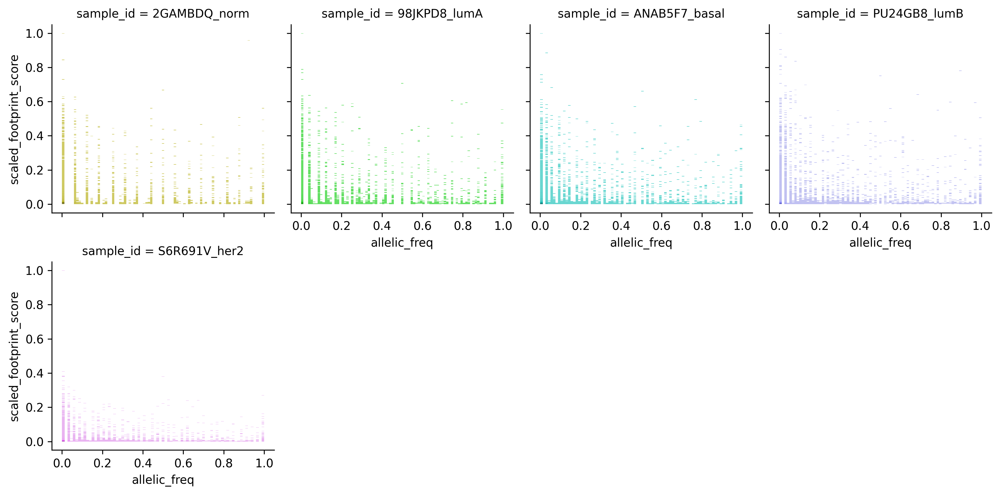

In [156]:
# Create a FacetGrid that creates one subplot for each unique 'sample_id'
g = sns.FacetGrid(merged_affps_df_lpv, col='sample_id', col_wrap=4, height=6, aspect=1)

# Create a color palette with the same number of colors as unique 'sample_id's
palette = sns.color_palette("hsv", n_colors=len(merged_affps_df_lpv['sample_id'].unique()))

# Get a list of unique 'sample_id's
sample_ids = merged_affps_df_lpv['sample_id'].unique()

# Map a displot to each subplot, using a different color for each subplot
for i, ax in enumerate(g.axes.flat):
    sns.histplot(merged_affps_df_lpv[merged_affps_df_lpv['sample_id'] == sample_ids[i]], x='allelic_freq', y='scaled_footprint_score', ax=ax, color=palette[i])

# Set the DPI and size of the figure
g.fig.set_dpi(300)
g.fig.set_figwidth(12)
g.fig.set_figheight(6)
plt.tight_layout()

plt.show()

Now let's do the same on the filtered datasets.

#### Filtering Strategy 1: AF > 0.5 and min-maxed FPS filtered at IQR Q1 and Q3

In [201]:
af_filt_result

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:818021-818032,0.8125,0.9000,0.8333,0.9000,0.8750
chr1:977015-977026,0.9412,1.0000,0.9474,0.9118,1.0000
chr1:977047-977058,0.5000,1.0000,0.7895,0.5882,0.7500
chr1:977110-977121,0.8529,0.9091,0.9444,1.0000,1.0000
chr1:977142-977153,0.5312,0.6250,1.0000,1.0000,1.0000
...,...,...,...,...,...
chrX:128928955-128928966,0.9286,0.8333,0.9500,0.9286,1.0000
chrX:130110575-130110586,1.0000,1.0000,1.0000,1.0000,1.0000
chrX:136147329-136147340,1.0000,0.9167,0.8824,0.9706,1.0000


In [202]:
fps_scaled_filt_result

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,0.0000,0.0000,0.0000,0.0000,0.0000
chr1:818021-818032,NaN,NaN,0.0028,NaN,NaN
chr1:818780-818791,NaN,NaN,0.0030,NaN,NaN
chr1:960570-960581,0.0740,0.0851,NaN,0.0752,0.0611
chr1:977015-977026,0.2902,0.1283,0.0928,0.3301,0.3458
...,...,...,...,...,...
chrX:153885794-153885805,NaN,NaN,0.0025,NaN,NaN
chrX:153934861-153934872,0.0519,0.0427,NaN,0.0518,0.0429
chrX:155010397-155010408,0.0031,0.0013,0.0011,0.0035,NaN


In [203]:
# merge the two dataframes on region_id row index
merged_affps_filt_df = pd.merge(af_filt_result, fps_scaled_filt_result, left_index=True, right_index=True, how='outer')
merged_affps_filt_df

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,,,,,,
chr10:100346639-100346650,NaN,NaN,NaN,NaN,NaN,NaN,0.0453,NaN,0.0800,0.0507
chr10:100913330-100913341,NaN,NaN,NaN,NaN,NaN,0.2066,0.1756,0.1027,0.2091,0.1914
chr10:1010727-1010738,NaN,NaN,NaN,NaN,NaN,0.0038,NaN,0.0026,NaN,NaN
chr10:101089689-101089700,NaN,NaN,NaN,NaN,NaN,NaN,0.0036,NaN,NaN,NaN
chr10:101219312-101219323,NaN,NaN,NaN,NaN,0.5833,NaN,NaN,0.0024,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
chrX:9786341-9786352,NaN,NaN,NaN,NaN,NaN,0.0510,NaN,NaN,0.0577,NaN
chrX:9786385-9786396,NaN,NaN,NaN,NaN,NaN,0.0493,NaN,NaN,0.0561,0.0437
chrX:9895379-9895390,NaN,NaN,NaN,NaN,NaN,NaN,0.0034,0.0019,NaN,0.0038


In [204]:
# convert to long format
merged_affps_filt_dfl = merged_affps_filt_df.reset_index().melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
merged_affps_filt_dfl[['sample_id', 'type']] = merged_affps_filt_dfl['variable'].str.rsplit('_', n=1, expand=True)

# # drop the redundant 'variable' column
merged_affps_filt_dfl = merged_affps_filt_dfl.drop(columns=["variable"])
merged_affps_filt_dfl

,region_id,value,sample_id,type
0,chr10:100346639-100346650,NaN,ANAB5F7_basal,AF
1,chr10:100913330-100913341,NaN,ANAB5F7_basal,AF
2,chr10:1010727-1010738,NaN,ANAB5F7_basal,AF
3,chr10:101089689-101089700,NaN,ANAB5F7_basal,AF
4,chr10:101219312-101219323,NaN,ANAB5F7_basal,AF
...,...,...,...,...
73125,chrX:9786341-9786352,NaN,2GAMBDQ_norm,fps
73126,chrX:9786385-9786396,0.0437,2GAMBDQ_norm,fps
73127,chrX:9895379-9895390,0.0038,2GAMBDQ_norm,fps
73128,chrX:9905569-9905580,NaN,2GAMBDQ_norm,fps


In [205]:
# now pivot the dataframe to create new columns based on the type column
merged_affps_filt_df_lpv = merged_affps_filt_dfl.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# rename the columns to match the type values
merged_affps_filt_df_lpv = merged_affps_filt_df_lpv.rename(columns={'fps': 'scaled_footprint_score', 'AF': 'allelic_freq'})
merged_affps_filt_df_lpv

type,region_id,sample_id,allelic_freq,scaled_footprint_score
0,chr10:100346639-100346650,2GAMBDQ_norm,NaN,0.0507
1,chr10:100346639-100346650,98JKPD8_lumA,NaN,NaN
2,chr10:100346639-100346650,ANAB5F7_basal,NaN,0.0453
3,chr10:100346639-100346650,PU24GB8_lumB,NaN,0.0800
4,chr10:100346639-100346650,S6R691V_her2,NaN,NaN
...,...,...,...,...
36560,chrY:11108019-11108030,2GAMBDQ_norm,NaN,0.0000
36561,chrY:11108019-11108030,98JKPD8_lumA,NaN,0.0000
36562,chrY:11108019-11108030,ANAB5F7_basal,NaN,0.0000
36563,chrY:11108019-11108030,PU24GB8_lumB,NaN,0.0000


Now we can filter NaN out. Any rows with NaN values will be dropped. 

In [206]:
# filter rows where NaN values exist in either column out
final_filt_affps_df = merged_affps_filt_df_lpv.dropna(subset=['allelic_freq', 'scaled_footprint_score'])
final_filt_affps_df

type,region_id,sample_id,allelic_freq,scaled_footprint_score
41,chr10:102791220-102791231,98JKPD8_lumA,0.8182,0.0033
43,chr10:102791220-102791231,PU24GB8_lumB,0.7333,0.0031
44,chr10:102791220-102791231,S6R691V_her2,0.7353,0.0020
60,chr10:103825905-103825916,2GAMBDQ_norm,1.0000,0.0039
62,chr10:103825905-103825916,ANAB5F7_basal,1.0000,0.0022
...,...,...,...,...
36262,chrX:3815156-3815167,ANAB5F7_basal,0.5000,0.3278
36264,chrX:3815156-3815167,S6R691V_her2,0.5294,0.1823
36306,chrX:41380362-41380373,98JKPD8_lumA,0.8125,0.0029
36309,chrX:41380362-41380373,S6R691V_her2,0.6000,0.0031


In [207]:
# now count the total number of unique region_id for each sample_id in the dataframe
df = final_filt_affps_df.groupby('sample_id')['region_id'].nunique().reset_index()
df = df.rename(columns={'region_id': 'unique_TFBS_counts'})

# save counts of unique region_id dataframe to file
df.to_csv("TFDP1_M08108_2.00_unique-counts-filtered-TFBS-with-variant.tsv", sep="\t", index=False, na_rep='NULL')

In [208]:
df

,sample_id,unique_TFBS_counts
0,2GAMBDQ_norm,308
1,98JKPD8_lumA,384
2,ANAB5F7_basal,428
3,PU24GB8_lumB,340
4,S6R691V_her2,521


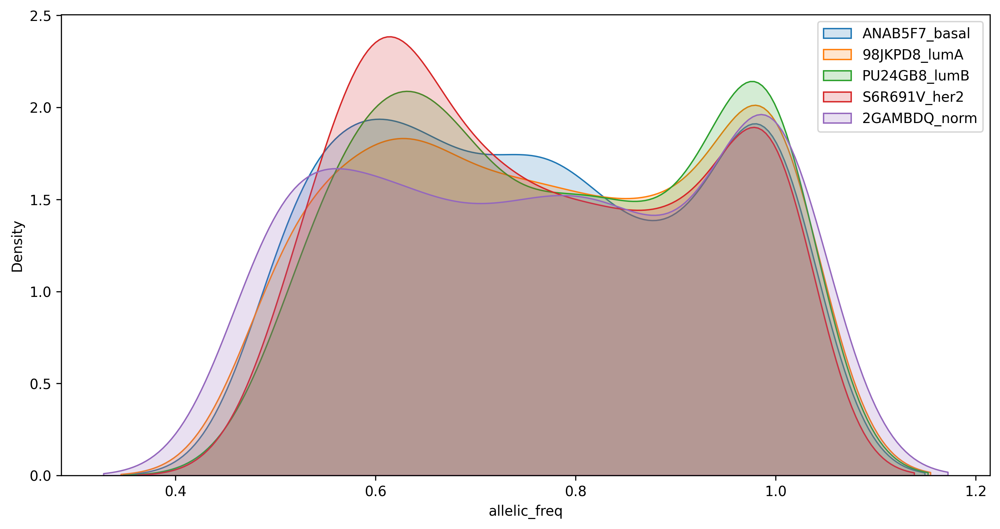

In [209]:
# plot kde
plt.figure(figsize=(12,6), dpi=300)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "ANAB5F7_basal"]
ax = sns.kdeplot(data=filtered_df['allelic_freq'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "98JKPD8_lumA"]
ax = sns.kdeplot(data=filtered_df['allelic_freq'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "PU24GB8_lumB"]
ax = sns.kdeplot(data=filtered_df['allelic_freq'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "S6R691V_her2"]
ax = sns.kdeplot(data=filtered_df['allelic_freq'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "2GAMBDQ_norm"]
ax = sns.kdeplot(data=filtered_df['allelic_freq'], fill=True, alpha=0.2)
plt.legend(['ANAB5F7_basal', '98JKPD8_lumA', 'PU24GB8_lumB', 'S6R691V_her2', '2GAMBDQ_norm'])
plt.show()

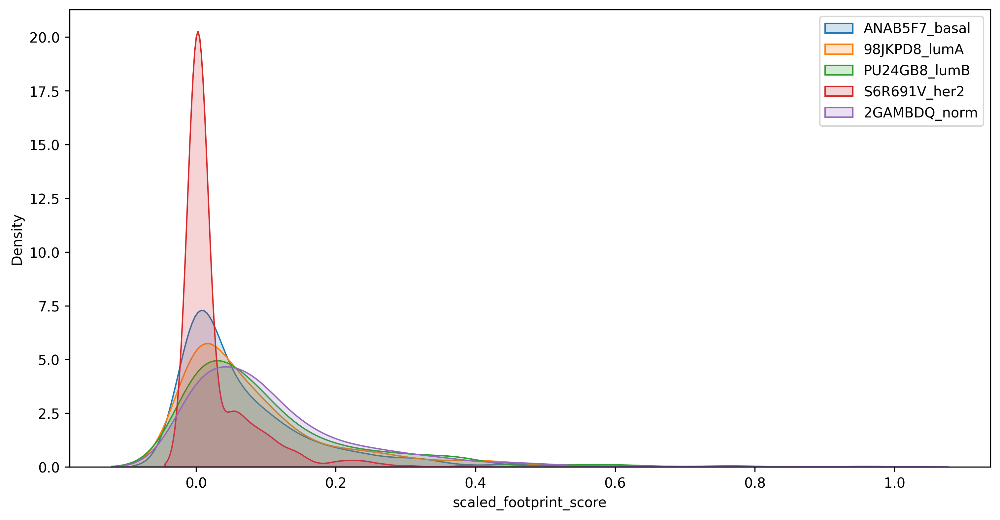

In [210]:
# plot kde
plt.figure(figsize=(12,6), dpi=300)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "ANAB5F7_basal"]
ax = sns.kdeplot(data=filtered_df['scaled_footprint_score'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "98JKPD8_lumA"]
ax = sns.kdeplot(data=filtered_df['scaled_footprint_score'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "PU24GB8_lumB"]
ax = sns.kdeplot(data=filtered_df['scaled_footprint_score'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "S6R691V_her2"]
ax = sns.kdeplot(data=filtered_df['scaled_footprint_score'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df[final_filt_affps_df['sample_id'] == "2GAMBDQ_norm"]
ax = sns.kdeplot(data=filtered_df['scaled_footprint_score'], fill=True, alpha=0.2)
plt.legend(['ANAB5F7_basal', '98JKPD8_lumA', 'PU24GB8_lumB', 'S6R691V_her2', '2GAMBDQ_norm'])
plt.show()

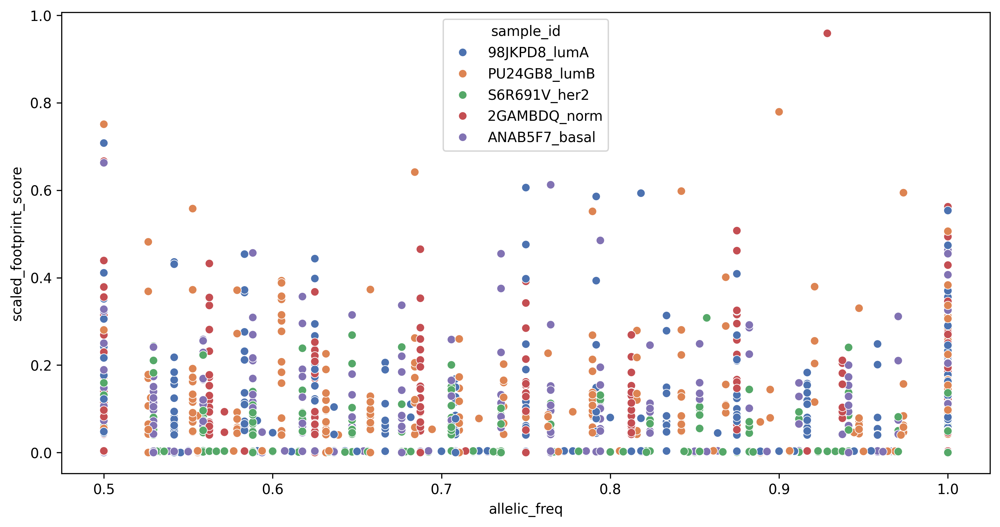

In [211]:
# plot scatterplot of allelic_freq vs scaled_footprint_score
plt.figure(figsize=(12,6), dpi=300)
ax = sns.scatterplot(data=final_filt_affps_df, x='allelic_freq', y='scaled_footprint_score', hue='sample_id', palette='deep')

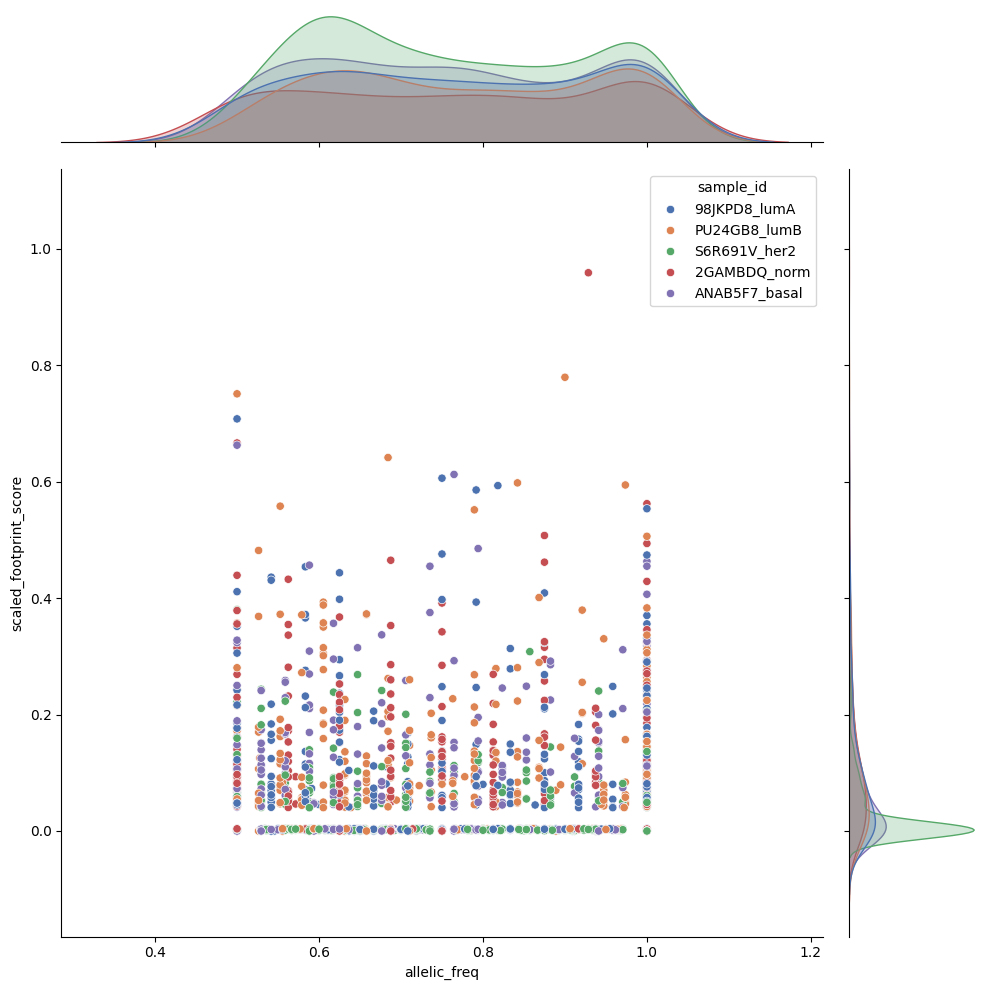

In [214]:
g = sns.jointplot(data=final_filt_affps_df, x='allelic_freq', y='scaled_footprint_score', hue='sample_id', palette='deep', height=10)
plt.show()

#### Filtering Strategy 2: Z-score normalized AF >= +3 (3 \sigma ) and z-score normalized FPS <= Q1 and >= Q3

In [176]:
afz_filt_result

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF
region_id,,,,,
chr1:818021-818032,3.0481,3.3136,3.1062,3.3807,3.1382
chr1:977015-977026,3.6181,3.7407,3.6056,3.4321,3.6617
chr1:977047-977058,NaN,3.7407,NaN,NaN,NaN
chr1:977110-977121,3.2272,3.3524,3.5928,3.8175,3.6617
chr1:977142-977153,NaN,NaN,3.8360,3.8175,3.6617
...,...,...,...,...,...
chrX:128606906-128606917,3.8787,3.7407,3.8360,3.8175,3.6617
chrX:128928955-128928966,3.5623,3.0288,3.6171,3.5055,3.6617
chrX:130110575-130110586,3.8787,3.7407,3.8360,3.8175,3.6617


In [177]:
fps_dfz_filt_result

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,
chr1:191257-191268,-0.5025,-0.5106,-0.5040,NaN,-0.5159
chr1:960570-960581,0.4047,0.5760,0.4682,0.3479,0.2570
chr1:977015-977026,3.0572,1.1278,1.9196,3.1965,3.8606
chr1:977047-977058,2.3498,0.8184,1.3102,2.5070,3.0854
chr1:977110-977121,-0.0776,NaN,NaN,0.0193,0.0050
...,...,...,...,...,...
chrX:139201111-139201122,0.0495,NaN,0.2265,NaN,-0.0614
chrX:150364468-150364479,NaN,0.1170,-0.0220,NaN,NaN
chrX:150364541-150364552,NaN,0.0442,NaN,NaN,NaN


In [178]:
# merge the two dataframes on region_id row index
merged_affps_filt_df2 = pd.merge(afz_filt_result, fps_dfz_filt_result, left_index=True, right_index=True, how='outer')
merged_affps_filt_df2

,ANAB5F7_basal_AF,98JKPD8_lumA_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,2GAMBDQ_norm_AF,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps
region_id,,,,,,,,,,
chr10:100346639-100346650,NaN,NaN,NaN,NaN,NaN,-0.0223,0.0676,0.2325,0.4019,0.1257
chr10:100913330-100913341,NaN,NaN,NaN,NaN,NaN,2.0311,1.7317,2.1781,1.8448,1.9062
chr10:101569883-101569894,NaN,NaN,NaN,NaN,NaN,-0.0738,0.1761,0.2031,0.4725,0.0896
chr10:102450741-102450752,NaN,NaN,NaN,NaN,NaN,0.5201,0.1585,0.4319,0.4393,0.4839
chr10:103193434-103193445,NaN,NaN,NaN,NaN,NaN,0.1635,0.1827,0.2336,0.0668,0.4092
...,...,...,...,...,...,...,...,...,...,...
chrX:72554506-72554517,NaN,NaN,NaN,NaN,NaN,NaN,0.1720,NaN,NaN,NaN
chrX:72554524-72554535,NaN,NaN,NaN,NaN,NaN,NaN,0.2529,NaN,NaN,NaN
chrX:9786341-9786352,NaN,NaN,NaN,NaN,NaN,0.1225,NaN,-0.0516,0.1530,-0.0747


In [179]:
# convert to long format
merged_affps_filt_dfl2 = merged_affps_filt_df2.reset_index().melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
merged_affps_filt_dfl2[['sample_id', 'type']] = merged_affps_filt_dfl2['variable'].str.rsplit('_', n=1, expand=True)

# # drop the redundant 'variable' column
merged_affps_filt_dfl2 = merged_affps_filt_dfl2.drop(columns=["variable"])
merged_affps_filt_dfl2

,region_id,value,sample_id,type
0,chr10:100346639-100346650,NaN,ANAB5F7_basal,AF
1,chr10:100913330-100913341,NaN,ANAB5F7_basal,AF
2,chr10:101569883-101569894,NaN,ANAB5F7_basal,AF
3,chr10:102450741-102450752,NaN,ANAB5F7_basal,AF
4,chr10:103193434-103193445,NaN,ANAB5F7_basal,AF
...,...,...,...,...
34775,chrX:72554506-72554517,NaN,2GAMBDQ_norm,fps
34776,chrX:72554524-72554535,NaN,2GAMBDQ_norm,fps
34777,chrX:9786341-9786352,-0.0747,2GAMBDQ_norm,fps
34778,chrX:9786385-9786396,0.0369,2GAMBDQ_norm,fps


In [180]:
# now pivot the dataframe to create new columns based on the type column
merged_affps_filt_df_lpv2 = merged_affps_filt_dfl2.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# rename the columns to match the type values
merged_affps_filt_df_lpv2 = merged_affps_filt_df_lpv2.rename(columns={'fps': 'normalized_footprint_score', 'AF': 'normalized_allelic_freq'})
merged_affps_filt_df_lpv2

type,region_id,sample_id,normalized_allelic_freq,normalized_footprint_score
0,chr10:100346639-100346650,2GAMBDQ_norm,NaN,0.1257
1,chr10:100346639-100346650,98JKPD8_lumA,NaN,-0.0223
2,chr10:100346639-100346650,ANAB5F7_basal,NaN,0.0676
3,chr10:100346639-100346650,PU24GB8_lumB,NaN,0.4019
4,chr10:100346639-100346650,S6R691V_her2,NaN,0.2325
...,...,...,...,...
17385,chrY:11108019-11108030,2GAMBDQ_norm,NaN,-0.5159
17386,chrY:11108019-11108030,98JKPD8_lumA,NaN,-0.5025
17387,chrY:11108019-11108030,ANAB5F7_basal,NaN,-0.5106
17388,chrY:11108019-11108030,PU24GB8_lumB,NaN,NaN


In [181]:
# filter rows where NaN values exist in either column out
final_filt_affps_df2 = merged_affps_filt_df_lpv2.dropna(subset=['normalized_allelic_freq', 'normalized_footprint_score'])
final_filt_affps_df2

type,region_id,sample_id,normalized_allelic_freq,normalized_footprint_score
65,chr10:113557593-113557604,2GAMBDQ_norm,3.6617,0.0865
67,chr10:113557593-113557604,ANAB5F7_basal,3.8787,-0.0313
85,chr10:11742332-11742343,2GAMBDQ_norm,3.6617,1.0748
86,chr10:11742332-11742343,98JKPD8_lumA,3.7407,0.7868
87,chr10:11742332-11742343,ANAB5F7_basal,3.6181,1.4221
...,...,...,...,...
17244,chrX:21940648-21940659,S6R691V_her2,3.8175,0.7790
17245,chrX:227349-227360,2GAMBDQ_norm,3.6617,-0.5159
17246,chrX:227349-227360,98JKPD8_lumA,3.7407,-0.5025
17247,chrX:227349-227360,ANAB5F7_basal,3.8787,-0.5106


In [182]:
# now count the total number of unique region_id for each sample_id in the dataframe
df2 = final_filt_affps_df2.groupby('sample_id')['region_id'].nunique().reset_index()
df2 = df2.rename(columns={'region_id': 'unique_TFBS_counts'})

# save counts of unique region_id dataframe to file
df2.to_csv("TFDP1_M08108_2.00_unique-counts-filtered-TFBS-with-variant-strat2.tsv", sep="\t", index=False, na_rep='NULL')

In [183]:
df2

,sample_id,unique_TFBS_counts
0,2GAMBDQ_norm,99
1,98JKPD8_lumA,109
2,ANAB5F7_basal,95
3,PU24GB8_lumB,95
4,S6R691V_her2,101


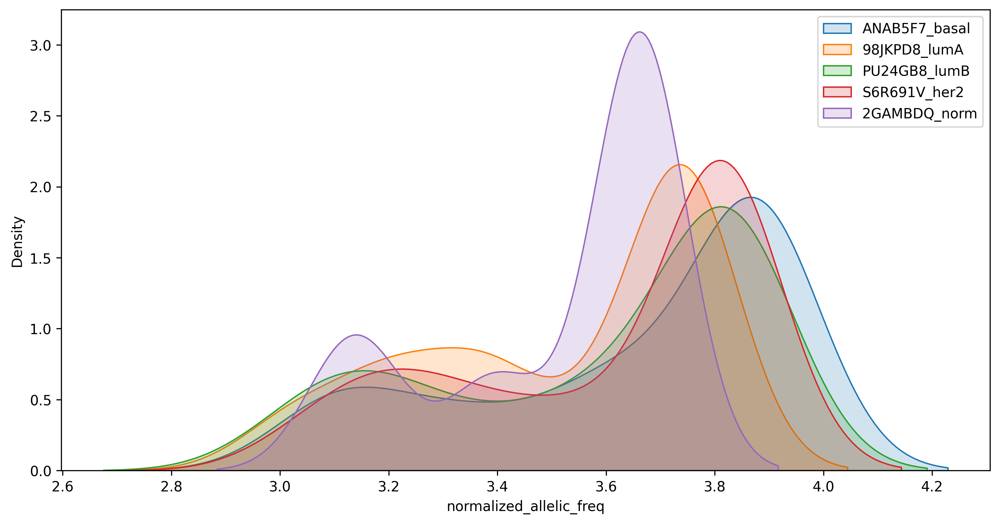

In [184]:
# plot kde
plt.figure(figsize=(12,6), dpi=300)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "ANAB5F7_basal"]
ax = sns.kdeplot(data=filtered_df['normalized_allelic_freq'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "98JKPD8_lumA"]
ax = sns.kdeplot(data=filtered_df['normalized_allelic_freq'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "PU24GB8_lumB"]
ax = sns.kdeplot(data=filtered_df['normalized_allelic_freq'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "S6R691V_her2"]
ax = sns.kdeplot(data=filtered_df['normalized_allelic_freq'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "2GAMBDQ_norm"]
ax = sns.kdeplot(data=filtered_df['normalized_allelic_freq'], fill=True, alpha=0.2)
plt.legend(['ANAB5F7_basal', '98JKPD8_lumA', 'PU24GB8_lumB', 'S6R691V_her2', '2GAMBDQ_norm'])
plt.show()

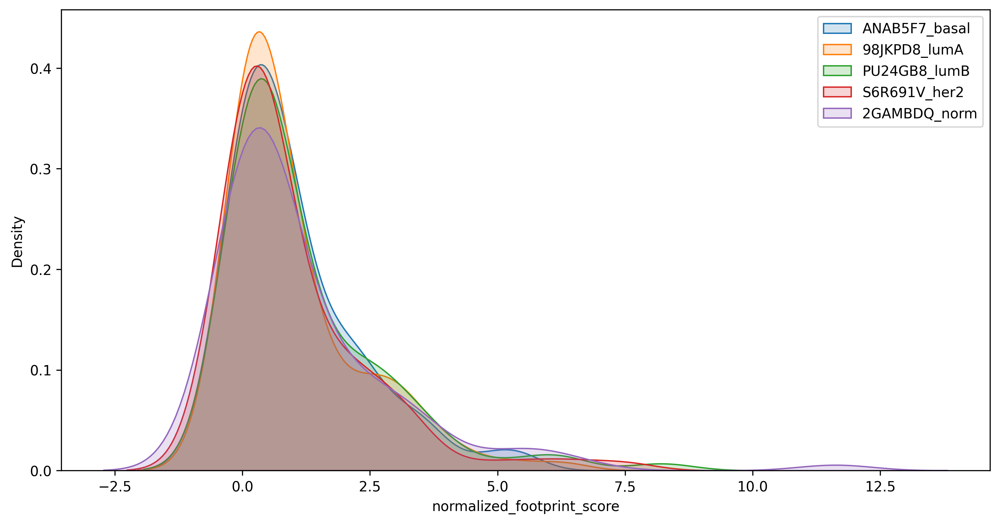

In [185]:
# plot kde
plt.figure(figsize=(12,6), dpi=300)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "ANAB5F7_basal"]
ax = sns.kdeplot(data=filtered_df['normalized_footprint_score'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "98JKPD8_lumA"]
ax = sns.kdeplot(data=filtered_df['normalized_footprint_score'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "PU24GB8_lumB"]
ax = sns.kdeplot(data=filtered_df['normalized_footprint_score'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "S6R691V_her2"]
ax = sns.kdeplot(data=filtered_df['normalized_footprint_score'], fill=True, alpha=0.2)
filtered_df = final_filt_affps_df2[final_filt_affps_df2['sample_id'] == "2GAMBDQ_norm"]
ax = sns.kdeplot(data=filtered_df['normalized_footprint_score'], fill=True, alpha=0.2)
plt.legend(['ANAB5F7_basal', '98JKPD8_lumA', 'PU24GB8_lumB', 'S6R691V_her2', '2GAMBDQ_norm'])
plt.show()

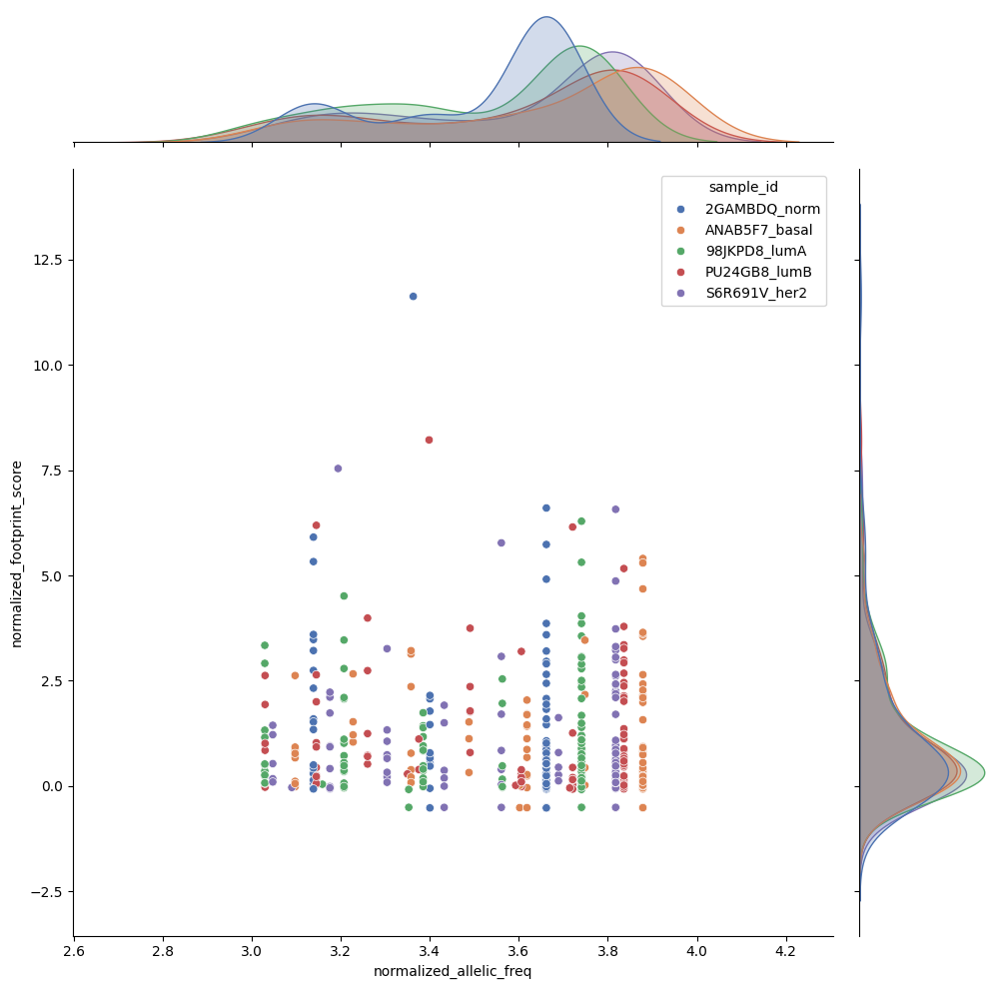

In [215]:
g = sns.jointplot(data=final_filt_affps_df2, x='normalized_allelic_freq', y='normalized_footprint_score', hue='sample_id', palette='deep', height=10)
plt.show()

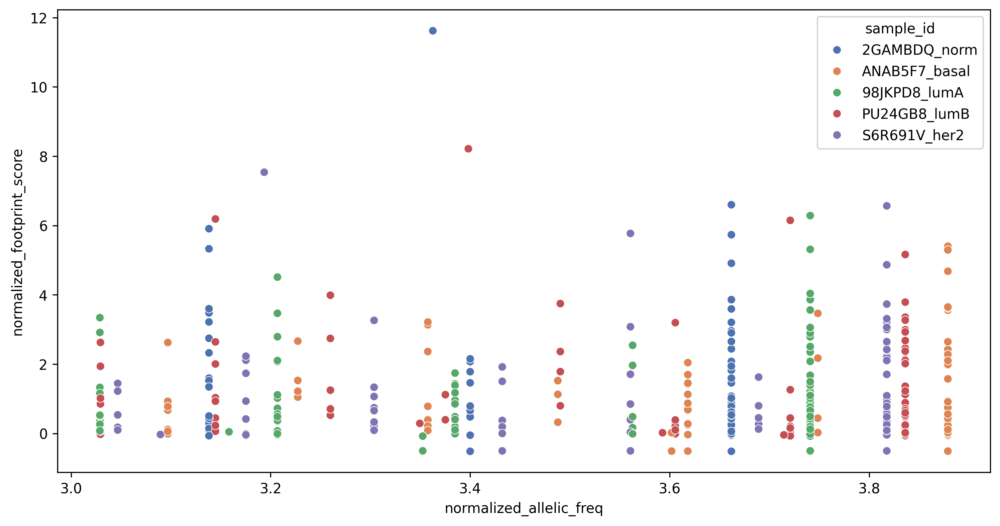

In [216]:
# plot scatterplot of allelic_freq vs scaled_footprint_score
plt.figure(figsize=(12,6), dpi=300)
ax = sns.scatterplot(data=final_filt_affps_df2, x='normalized_allelic_freq', y='normalized_footprint_score', hue='sample_id', palette='deep')